In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip install pyro-ppl
!pip install pot
!pip install tensorboard
!pip install torchdiffeq

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [4]:
!rm -rf PFNExperiments
!git clone https://github.com/ArikReuter/PFNExperiments

Cloning into 'PFNExperiments'...
remote: Enumerating objects: 1392, done.
remote: Counting objects: 100% (165/165), done.
remote: Compressing objects: 100% (112/112), done.
remote: Total 1392 (delta 109), reused 102 (delta 53), pack-reused 1227
Receiving objects: 100% (1392/1392), 57.48 MiB | 16.35 MiB/s, done.
Resolving deltas: 100% (993/993), done.


In [5]:
import torch
from PFNExperiments.LinearRegression.GenerativeModels.GenerateData_LogReg import make_logreg_program_ig_batched, make_logreg_program_ig
from PFNExperiments.LinearRegression.GenerativeModels.LM_abstract import return_only_y, print_code
from PFNExperiments.Training.Trainer import visualize_training_results
from PFNExperiments.Training.FlowMatching.CFMLossOTGaussianBase_plus_NLL import CFMLossOTGaussianBase_plus_NLL
from PFNExperiments.LinearRegression.ComparisonModels.Hamiltionion_MC import Hamiltionian_MC
from PFNExperiments.LinearRegression.ComparisonModels.Variational_Inference import Variational_Inference
from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.GenerativeModels.Curriculum import Curriculum
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataCurriculumCFM import GenerateDataCurriculumCFM
from PFNExperiments.Training.TrainerCurriculumCNF_LearnedBaseDist_plus_nll import TrainerCurriculumCNF_LearnedBaseDist_plus_nll

from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF_LearnedBaseDist import ModelToPosteriorCNF_LearnedBaseDist
from PFNExperiments.LinearRegression.Models.Transformer import MLP
from PFNExperiments.LinearRegression.Models.ModelPosterior import ModelPosteriorFullGaussian2
from PFNExperiments.LinearRegression.Models.Transformer_CNF_DoubleCondition2 import TransformerDecoderConditionalDouble_parallel, MLPConditionalDouble_parallel
from PFNExperiments.LinearRegression.Models.Transformer_CNF_LearnedBaseDistribution import TransformerReturnRepresentations, TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2, TransformerPlusNLP
from PFNExperiments.LinearRegression.ComparisonModels.AnalyticalSolutionsLM import PosteriorLM_IG
from PFNExperiments.Evaluation.Evaluate import Evaluate

from PFNExperiments.LinearRegression.ComparisonModels.Variational_InferenceAutoguide import Variational_InferenceAutoguide

from pyro.infer.autoguide import AutoDiagonalNormal, AutoMultivariateNormal, AutoLaplaceApproximation, AutoIAFNormal, AutoStructured

In [6]:
torch.backends.cudnn.benchmark = True

In [7]:
make_lm_program = make_logreg_program_ig
make_lm_program_batched= make_logreg_program_ig_batched

N = 100
P = 10
BATCH_SIZE = 1024
N_EPOCHS = 100
N_SAMPLES_PER_EPOCH = 500_000
N_BATCHES_PER_EPOCH = N_SAMPLES_PER_EPOCH//BATCH_SIZE
SAVE_PATH = "/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM"
SAVE_PATH_EVALUATION = f"{SAVE_PATH}/PFN_Experiments_CFM_InvGammaGammPrior_LearnedBaseDist_plus_nll_Fm_on_top"
#BATCH_SIZE = 128

In [8]:
a = 5.0
b = 2.0
tau = 0.5

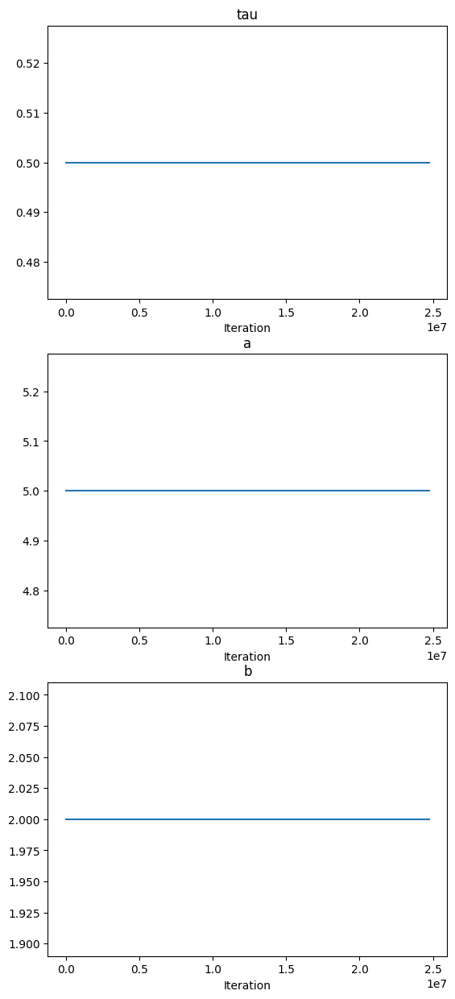

In [9]:
curriculum = Curriculum(max_iter=int(N_EPOCHS*N_BATCHES_PER_EPOCH*BATCH_SIZE*0.5))
curriculum.add_param_list(
    [
    ("tau", curriculum.constant_scheduler(tau)),
    ("a", curriculum.constant_scheduler(a)),
    ("b", curriculum.constant_scheduler(b)),

    ]
)
curriculum.plot_all_schedules()

In [10]:
curriculum.get_params(99*N_SAMPLES_PER_EPOCH)

{'tau': 0.5, 'a': 5.0, 'b': 2.0}

In [11]:
data_generator = GenerateDataCurriculumCFM(
    pprogram_maker= make_logreg_program_ig_batched,
    curriculum= curriculum,
)

####################################################################################################
Epoch 0


100%|██████████| 10/10 [00:00<00:00, 11.94it/s]


{'X': {'mean': tensor(0.4999), 'variance': tensor(0.0833), 'min': tensor(3.5763e-07), 'max': tensor(1.0000)}, 'y': {'mean': tensor(0.5049), 'variance': tensor(0.2500), 'min': tensor(0.), 'max': tensor(1.)}, 'beta': {'mean': tensor([0.0046, 0.0108, 0.0010, 0.0037, 0.0105]), 'variance': tensor([0.2441, 0.2600, 0.2510, 0.2540, 0.2343]), 'min': tensor([-1.7861, -1.9221, -1.6441, -2.0734, -1.8330]), 'max': tensor([1.9054, 1.6853, 1.8307, 1.6696, 1.5069])}}
Statistics for sigma_squared:
Mean: tensor([0.5025])
Variance: tensor([0.0898])
Min: tensor([0.1147])
Max: tensor([3.6250])


Statistics for time:
Mean: 0.5108830087585374
Variance: 0.08117086239076496
Min: 0.00031632184982299805
Max: 0.999437153339386


Statistics for base_sample_beta:
Mean: tensor([ 0.0066, -0.0387,  0.0136, -0.0163, -0.0322])
Variance: tensor([0.9647, 0.9863, 0.9704, 0.9710, 1.0069])
Min: tensor([-3.2920, -3.1799, -3.3285, -3.7407, -3.7480])
Max: tensor([3.3462, 3.6349, 3.6279, 3.3477, 3.3875])




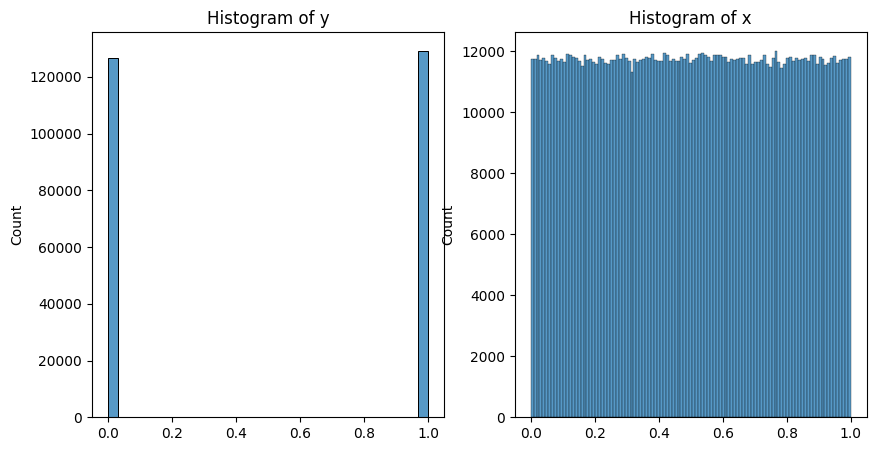

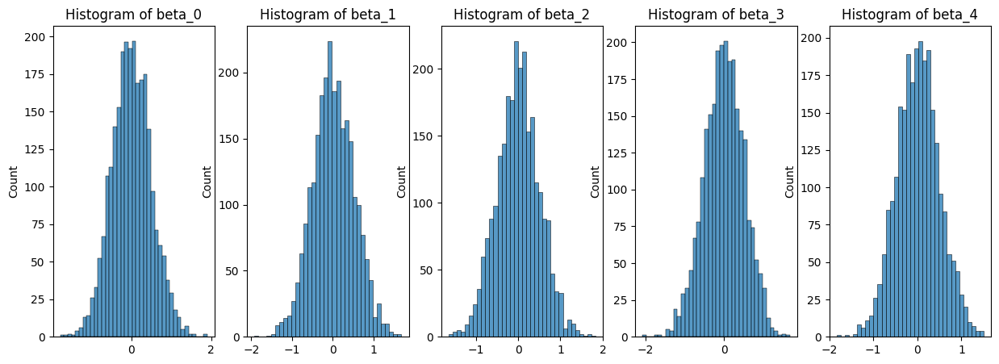

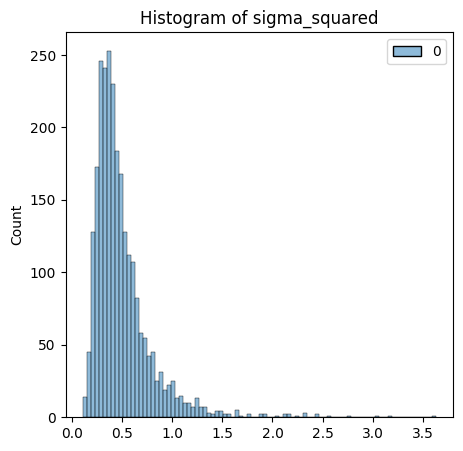

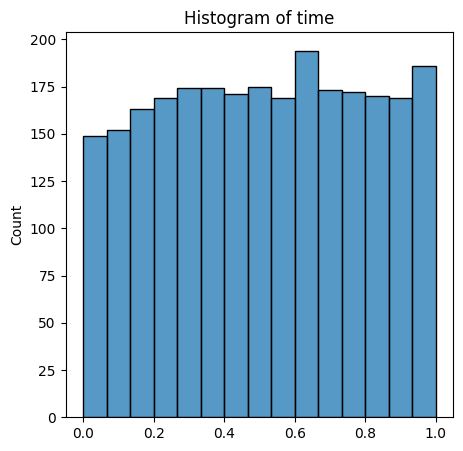

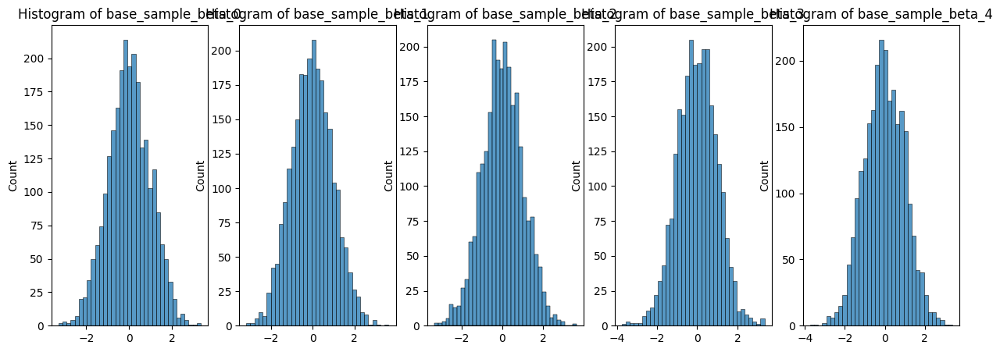

####################################################################################################
Epoch 99


100%|██████████| 10/10 [00:00<00:00, 77.34it/s]

{'X': {'mean': tensor(0.5000), 'variance': tensor(0.0833), 'min': tensor(7.1526e-07), 'max': tensor(1.0000)}, 'y': {'mean': tensor(0.4978), 'variance': tensor(0.2500), 'min': tensor(0.), 'max': tensor(1.)}, 'beta': {'mean': tensor([ 0.0099, -0.0121, -0.0139,  0.0096,  0.0026]), 'variance': tensor([0.2437, 0.2546, 0.2477, 0.2493, 0.2422]), 'min': tensor([-1.7453, -1.5725, -1.5192, -1.5577, -1.6408]), 'max': tensor([1.6507, 1.6673, 1.7142, 1.8233, 1.8046])}}
Statistics for sigma_squared:
Mean: tensor([0.4989])
Variance: tensor([0.0878])
Min: tensor([0.1305])
Max: tensor([3.7443])


Statistics for time:
Mean: 0.49040824805852024
Variance: 0.08224782114638098
Min: 0.00035321712493896484
Max: 0.9996832013130188


Statistics for base_sample_beta:
Mean: tensor([-0.0176,  0.0224, -0.0173, -0.0234,  0.0099])
Variance: tensor([0.9622, 1.0075, 0.9700, 1.0154, 1.0093])
Min: tensor([-3.4015, -3.1249, -3.1906, -3.7048, -3.5145])
Max: tensor([3.6320, 3.6939, 3.4183, 3.5767, 3.4198])




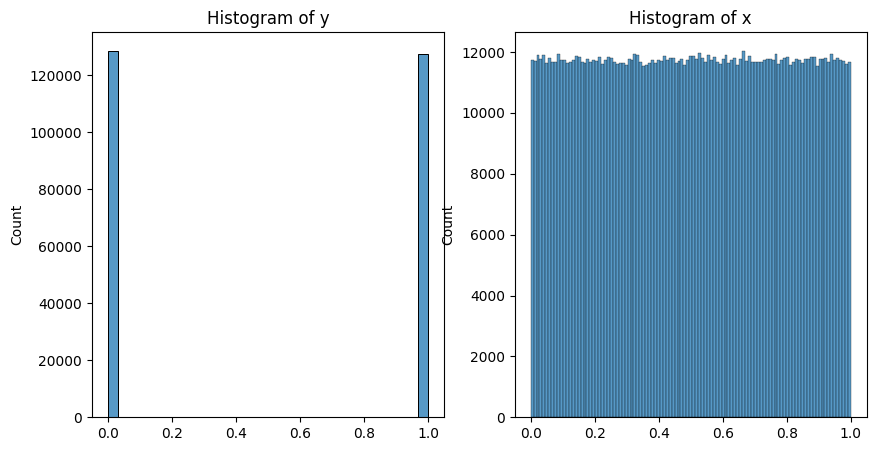

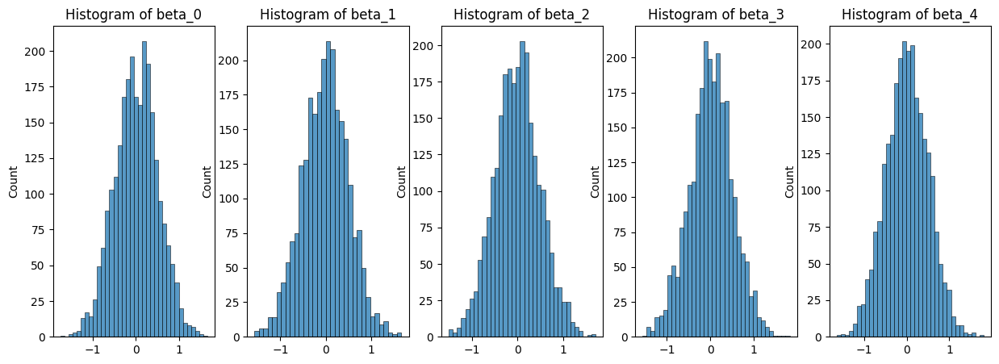

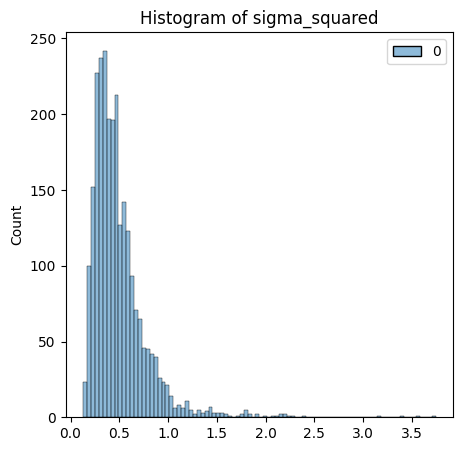

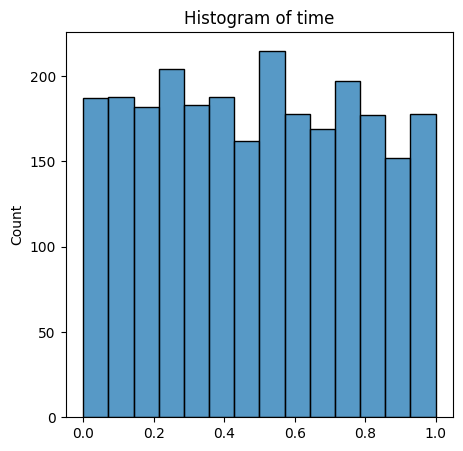

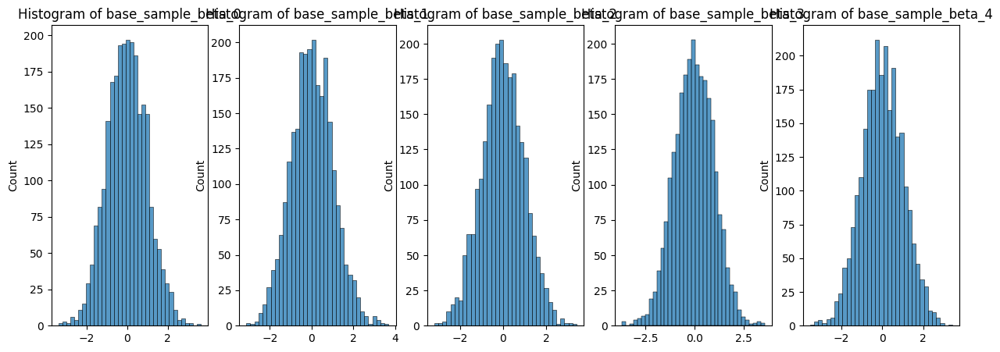

[{'X': {'mean': tensor(0.4999),
   'variance': tensor(0.0833),
   'min': tensor(3.5763e-07),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(0.5049),
   'variance': tensor(0.2500),
   'min': tensor(0.),
   'max': tensor(1.)},
  'beta': {'mean': tensor([0.0046, 0.0108, 0.0010, 0.0037, 0.0105]),
   'variance': tensor([0.2441, 0.2600, 0.2510, 0.2540, 0.2343]),
   'min': tensor([-1.7861, -1.9221, -1.6441, -2.0734, -1.8330]),
   'max': tensor([1.9054, 1.6853, 1.8307, 1.6696, 1.5069])}},
 {'X': {'mean': tensor(0.5000),
   'variance': tensor(0.0833),
   'min': tensor(7.1526e-07),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(0.4978),
   'variance': tensor(0.2500),
   'min': tensor(0.),
   'max': tensor(1.)},
  'beta': {'mean': tensor([ 0.0099, -0.0121, -0.0139,  0.0096,  0.0026]),
   'variance': tensor([0.2437, 0.2546, 0.2477, 0.2493, 0.2422]),
   'min': tensor([-1.7453, -1.5725, -1.5192, -1.5577, -1.6408]),
   'max': tensor([1.6507, 1.6673, 1.7142, 1.8233, 1.8046])}}]

In [12]:
data_generator.check_model(
    n_samples_per_epoch=N_SAMPLES_PER_EPOCH,
    epochs_to_check = [0, N_EPOCHS-1],
    p = 5,
    used_batch_samples = 10
)

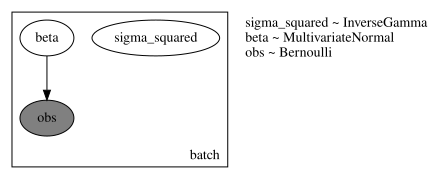

In [13]:
data_generator.render_model()

In [14]:
epoch_loader = data_generator.make_epoch_loader(
    n = N,
    p = P,
    number_of_batches_per_epoch = N_BATCHES_PER_EPOCH,
    n_epochs = N_EPOCHS,
    batch_size= BATCH_SIZE,
    train_frac= 0.5,
    val_frac= 0.1,
    shuffle=False,
    n_samples_to_generate_at_once = 250_000
)

The number of batches times the number of epochs must be equal to the total number of iterations in the curriculum. But got 49971200 and 24985600 respectively


In [15]:
#save_path_model = "/content/drive/MyDrive/PFN_Experiments/Training_Runs/experiment_2024_05_29_07_37_35/model.pth"

In [16]:
model_posterior = ModelPosteriorFullGaussian2(cov_reg_factor = 1e-3, use_lowrank_normal = False, diag_transform = lambda x: x**2)

nll_loss = model_posterior.negative_log_likelihood
nll_loss_avg = model_posterior.negative_log_likelihood_avg
nll_loss_std = model_posterior.negative_log_likelihood_std
nll_loss_median = model_posterior.negative_log_likelihood_median

encoder = TransformerReturnRepresentations(
    n_features= P+1,
    seq_len= N,
    d_model= 384,
    n_heads= 6,
    dim_feedforward=384*2,
    dropout_rate = 0.1,
    n_layers=7,
    n_skip_layers_final_heads = 3,
    n_output_units_per_head=[P, P*P, P]
)

encoder_to_process_encoder_output = torch.nn.TransformerEncoder(
    torch.nn.TransformerEncoderLayer(d_model=encoder.d_model,
                                     nhead=encoder.n_heads,
                                     dim_feedforward = encoder.dim_feedforward,
                                     batch_first = True,
                                     norm_first = True),
    num_layers=4)


#encoder.load_state_dict(torch.load(save_path_model, map_location=torch.device('cpu')))
# get the correct class to transform model predictions to posterior samples


mlp_to_process_encoder_output = MLP(
    n_input_units = encoder.d_model,
    n_output_units= 512,
    n_hidden_units= 512,
    n_skip_layers= 2,
    dropout_rate = 0.1
)

model_to_process_encoder_output_for_decoder = TransformerPlusNLP(
    transformer_encoder = encoder_to_process_encoder_output,
    mlp = mlp_to_process_encoder_output
)


mlp_to_process_time_conditioning = MLP(
    n_input_units = 1,
    n_output_units = 512,
    n_hidden_units= 512,
    n_skip_layers= 2,
    dropout_rate = 0.1
)
decoder = TransformerDecoderConditionalDouble_parallel(
    n_input_features= P,
    d_model_decoder= 512,
    d_model_encoder= encoder.d_model,
    n_heads= 4,
    d_ff = 512,
    dropout= 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units,
    n_layers= 4,
    use_positional_encoding=False,
    use_self_attention=False,
)
mlp_to_process_decoder_output = MLPConditionalDouble_parallel(
    n_input_units= decoder.d_model_decoder,
    n_output_units = P,
    n_hidden_units = 512,
    n_skip_layers = 2,
    dropout_rate = 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units
)
model = TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2(
    encoder = encoder,
    model_posterior = model_posterior,
    model_to_process_encoder_output = model_to_process_encoder_output_for_decoder,
    mlp_to_process_time_conditioning = mlp_to_process_time_conditioning,
    mlp_to_process_decoder_output = mlp_to_process_decoder_output,
    decoder = decoder,
    freeze_encoder=False,
)




/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:306: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


In [17]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [18]:
'{:.2e}'.format(count_parameters(model))

'5.31e+07'

In [19]:
import torch
from torch.optim.lr_scheduler import ReduceLROnPlateau, OneCycleLR

In [20]:
lr = 1e-4
opt = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-5)

In [21]:
loss_fun = CFMLossOTGaussianBase_plus_NLL(
    weight_nll = 0.5,
    NLL_Loss_function= nll_loss,
    sigma_min=0.0,
    return_sub_losses=True
)

In [22]:
scheduler = OneCycleLR(opt,
                       max_lr = 1e-4,
                       epochs = N_EPOCHS,
                       steps_per_epoch = N_SAMPLES_PER_EPOCH//BATCH_SIZE,
                       pct_start = 0.1,
                       div_factor=25.0,
                       final_div_factor= 1e3)

#scheduler = ReduceLROnPlateau(opt)

additional_evals = {
    "nll_loss": nll_loss,
    "nll_loss_avg": nll_loss_avg,
    "nll_loss_std": nll_loss_std,
    "nll_loss_median": nll_loss_median
}

In [23]:
#?TrainerCurriculumCNF

In [24]:
trainer = TrainerCurriculumCNF_LearnedBaseDist_plus_nll(
    model = model,
    optimizer=opt,
    scheduler = scheduler,
    loss_function=loss_fun,
    epoch_loader = epoch_loader,
    evaluation_functions= additional_evals,
    n_epochs = N_EPOCHS,
    early_stopping_patience = 200,
    schedule_step_on = "batch",
    save_path = SAVE_PATH,
    use_same_timestep_per_batch = False,
    use_train_mode_during_validation = False,
    sub_losses_names = ["loss_FM", "loss_NLL"],
    max_gradient_norm = 1.0,
    stop_gradients_from_FM_to_encoder = False,
    coupling = None
)

In [25]:
trainer.set_new_save_path("/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_31_17_27_35")
trainer.save_path

'/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_31_17_27_35'

In [26]:
try:
  trainer.load_best_model()
except Exception as e:
  print("Could not load model")
  print(e)
  pass

In [ ]:
trainer.validate()

100%|██████████| 49/49 [00:16<00:00,  3.06it/s]


{'loss_mean': 28.52887535095215,
 'loss_median': 28.558347702026367,
 'loss_std': 0.6028890609741211,
 'loss_FM_mean': 0.5271171927452087,
 'loss_FM_median': 0.5274511575698853,
 'loss_FM_std': 0.005969234276562929,
 'loss_NLL_mean': 56.53063201904297,
 'loss_NLL_median': 56.57866668701172,
 'loss_NLL_std': 1.203971028327942}

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/runs

<IPython.core.display.Javascript object>

In [ ]:
r = trainer.train()

Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 0


100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 0:
Training: {'loss_mean': 9.981017112731934, 'loss_median': 10.003165245056152, 'loss_std': 0.25797250866889954, 'loss_FM_mean': 4.243765830993652, 'loss_FM_median': 4.251346588134766, 'loss_FM_std': 0.18561013042926788, 'loss_NLL_mean': 15.718268394470215, 'loss_NLL_median': 15.756965637207031, 'loss_NLL_std': 0.34758591651916504}
Validation: {'loss_mean': 6.5412397384643555, 'loss_median': 6.5359954833984375, 'loss_std': 0.09555954486131668, 'loss_FM_mean': 1.0525044202804565, 'loss_FM_median': 1.0544928312301636, 'loss_FM_std': 0.019452478736639023, 'loss_NLL_mean': 12.029974937438965, 'loss_NLL_median': 12.018060684204102, 'loss_NLL_std': 0.19001664221286774}
Validation curriculum: {'loss_mean': 6.525616645812988, 'loss_median': 6.534505367279053, 'loss_std': 0.09644201397895813, 'loss_FM_mean': 1.0444430112838745, 'loss_FM_median': 1.0439631938934326, 'loss_FM_std': 0.02143040858209133, 'loss_NLL_mean': 12.006790161132812, 'loss_NLL_median': 12.036334991455078, 'loss_NLL_st

100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 1:
Training: {'loss_mean': 8.135695457458496, 'loss_median': 8.060724258422852, 'loss_std': 0.7454155683517456, 'loss_FM_mean': 2.947904348373413, 'loss_FM_median': 2.8674190044403076, 'loss_FM_std': 0.5220887660980225, 'loss_NLL_mean': 13.323486328125, 'loss_NLL_median': 13.25846004486084, 'loss_NLL_std': 0.973962128162384}
Validation: {'loss_mean': 5.385641098022461, 'loss_median': 5.378241062164307, 'loss_std': 0.11209996044635773, 'loss_FM_mean': 0.671715497970581, 'loss_FM_median': 0.6619758009910583, 'loss_FM_std': 0.03752492740750313, 'loss_NLL_mean': 10.099567413330078, 'loss_NLL_median': 10.089771270751953, 'loss_NLL_std': 0.21679148077964783}
Validation curriculum: {'loss_mean': 5.4274797439575195, 'loss_median': 5.404614448547363, 'loss_std': 0.2701471447944641, 'loss_FM_mean': 0.7417885661125183, 'loss_FM_median': 0.6666946411132812, 'loss_FM_std': 0.5085985660552979, 'loss_NLL_mean': 10.113170623779297, 'loss_NLL_median': 10.095523834228516, 'loss_NLL_std': 0.2543067

100%|██████████| 49/49 [00:15<00:00,  3.21it/s]


Epoch 2:
Training: {'loss_mean': 6.378648281097412, 'loss_median': 6.37504243850708, 'loss_std': 0.3453075587749481, 'loss_FM_mean': 1.9035574197769165, 'loss_FM_median': 1.8953567743301392, 'loss_FM_std': 0.16972996294498444, 'loss_NLL_mean': 10.853738784790039, 'loss_NLL_median': 10.857555389404297, 'loss_NLL_std': 0.538852870464325}
Validation: {'loss_mean': 4.429744243621826, 'loss_median': 4.42676305770874, 'loss_std': 0.05620294064283371, 'loss_FM_mean': 0.614854097366333, 'loss_FM_median': 0.610058069229126, 'loss_FM_std': 0.023812510073184967, 'loss_NLL_mean': 8.244633674621582, 'loss_NLL_median': 8.25132942199707, 'loss_NLL_std': 0.10446780174970627}
Validation curriculum: {'loss_mean': 4.42988920211792, 'loss_median': 4.424804210662842, 'loss_std': 0.06687052547931671, 'loss_FM_mean': 0.6142946481704712, 'loss_FM_median': 0.6121390461921692, 'loss_FM_std': 0.018601853400468826, 'loss_NLL_mean': 8.2454833984375, 'loss_NLL_median': 8.240789413452148, 'loss_NLL_std': 0.136557102

100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 3:
Training: {'loss_mean': 5.318515300750732, 'loss_median': 5.2933526039123535, 'loss_std': 0.2592772841453552, 'loss_FM_mean': 1.5388193130493164, 'loss_FM_median': 1.5391018390655518, 'loss_FM_std': 0.12603309750556946, 'loss_NLL_mean': 9.098212242126465, 'loss_NLL_median': 9.036747932434082, 'loss_NLL_std': 0.4460311233997345}
Validation: {'loss_mean': 3.814857244491577, 'loss_median': 3.8129961490631104, 'loss_std': 0.042621441185474396, 'loss_FM_mean': 0.5586858987808228, 'loss_FM_median': 0.5541909337043762, 'loss_FM_std': 0.03010338358581066, 'loss_NLL_mean': 7.071028709411621, 'loss_NLL_median': 7.068354606628418, 'loss_NLL_std': 0.07579267770051956}
Validation curriculum: {'loss_mean': 3.8200223445892334, 'loss_median': 3.813765525817871, 'loss_std': 0.04202412813901901, 'loss_FM_mean': 0.5588784217834473, 'loss_FM_median': 0.553773045539856, 'loss_FM_std': 0.028875987976789474, 'loss_NLL_mean': 7.0811662673950195, 'loss_NLL_median': 7.071740627288818, 'loss_NLL_std': 0

100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 4:
Training: {'loss_mean': 4.688834190368652, 'loss_median': 4.669137954711914, 'loss_std': 0.23805567622184753, 'loss_FM_mean': 1.353187084197998, 'loss_FM_median': 1.3395419120788574, 'loss_FM_std': 0.16477517783641815, 'loss_NLL_mean': 8.024481773376465, 'loss_NLL_median': 7.985383033752441, 'loss_NLL_std': 0.37091904878616333}
Validation: {'loss_mean': 3.650693893432617, 'loss_median': 3.645639181137085, 'loss_std': 0.05246519669890404, 'loss_FM_mean': 0.529160737991333, 'loss_FM_median': 0.5213540196418762, 'loss_FM_std': 0.04317124933004379, 'loss_NLL_mean': 6.7722272872924805, 'loss_NLL_median': 6.771480560302734, 'loss_NLL_std': 0.08596155047416687}
Validation curriculum: {'loss_mean': 3.660409450531006, 'loss_median': 3.664090394973755, 'loss_std': 0.04688052460551262, 'loss_FM_mean': 0.5243678092956543, 'loss_FM_median': 0.5192779302597046, 'loss_FM_std': 0.024647675454616547, 'loss_NLL_mean': 6.796451091766357, 'loss_NLL_median': 6.802083969116211, 'loss_NLL_std': 0.08

100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 5:
Training: {'loss_mean': 4.4085893630981445, 'loss_median': 4.370347499847412, 'loss_std': 0.26401060819625854, 'loss_FM_mean': 1.267640233039856, 'loss_FM_median': 1.236997365951538, 'loss_FM_std': 0.1931910663843155, 'loss_NLL_mean': 7.549537658691406, 'loss_NLL_median': 7.500668525695801, 'loss_NLL_std': 0.40980759263038635}
Validation: {'loss_mean': 3.5936031341552734, 'loss_median': 3.596403121948242, 'loss_std': 0.040608301758766174, 'loss_FM_mean': 0.4989628195762634, 'loss_FM_median': 0.4988672435283661, 'loss_FM_std': 0.012074689380824566, 'loss_NLL_mean': 6.688243865966797, 'loss_NLL_median': 6.69719123840332, 'loss_NLL_std': 0.07434491813182831}
Validation curriculum: {'loss_mean': 3.596771478652954, 'loss_median': 3.596060037612915, 'loss_std': 0.03612160682678223, 'loss_FM_mean': 0.5027849078178406, 'loss_FM_median': 0.5004470944404602, 'loss_FM_std': 0.01800640858709812, 'loss_NLL_mean': 6.690757751464844, 'loss_NLL_median': 6.696116924285889, 'loss_NLL_std': 0.06

100%|██████████| 49/49 [00:14<00:00,  3.29it/s]


Epoch 6:
Training: {'loss_mean': 4.257761001586914, 'loss_median': 4.211362361907959, 'loss_std': 0.2269894778728485, 'loss_FM_mean': 1.204959750175476, 'loss_FM_median': 1.1536582708358765, 'loss_FM_std': 0.1896393597126007, 'loss_NLL_mean': 7.31056022644043, 'loss_NLL_median': 7.240871429443359, 'loss_NLL_std': 0.3369321823120117}
Validation: {'loss_mean': 3.4864068031311035, 'loss_median': 3.485960006713867, 'loss_std': 0.04056539759039879, 'loss_FM_mean': 0.48789191246032715, 'loss_FM_median': 0.48424920439720154, 'loss_FM_std': 0.013975088484585285, 'loss_NLL_mean': 6.484920978546143, 'loss_NLL_median': 6.484946250915527, 'loss_NLL_std': 0.07915947586297989}
Validation curriculum: {'loss_mean': 3.4729959964752197, 'loss_median': 3.4710097312927246, 'loss_std': 0.044958434998989105, 'loss_FM_mean': 0.4902750849723816, 'loss_FM_median': 0.486610472202301, 'loss_FM_std': 0.02115737274289131, 'loss_NLL_mean': 6.455717086791992, 'loss_NLL_median': 6.429629325866699, 'loss_NLL_std': 0.0

100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 7:
Training: {'loss_mean': 4.196049213409424, 'loss_median': 4.100691318511963, 'loss_std': 0.40836676955223083, 'loss_FM_mean': 1.1830432415008545, 'loss_FM_median': 1.145640254020691, 'loss_FM_std': 0.1924523562192917, 'loss_NLL_mean': 7.209055423736572, 'loss_NLL_median': 7.041779518127441, 'loss_NLL_std': 0.6770493388175964}
Validation: {'loss_mean': 3.435328960418701, 'loss_median': 3.431191921234131, 'loss_std': 0.03947613015770912, 'loss_FM_mean': 0.48669955134391785, 'loss_FM_median': 0.4868380129337311, 'loss_FM_std': 0.014728468842804432, 'loss_NLL_mean': 6.383958339691162, 'loss_NLL_median': 6.379508972167969, 'loss_NLL_std': 0.07149110734462738}
Validation curriculum: {'loss_mean': 3.435229539871216, 'loss_median': 3.43894362449646, 'loss_std': 0.04668087884783745, 'loss_FM_mean': 0.4851208031177521, 'loss_FM_median': 0.48388171195983887, 'loss_FM_std': 0.013757850974798203, 'loss_NLL_mean': 6.385337829589844, 'loss_NLL_median': 6.3934173583984375, 'loss_NLL_std': 0.0

100%|██████████| 49/49 [00:14<00:00,  3.29it/s]


Epoch 8:
Training: {'loss_mean': 4.030106067657471, 'loss_median': 3.957339286804199, 'loss_std': 0.27921566367149353, 'loss_FM_mean': 1.1048752069473267, 'loss_FM_median': 1.0827864408493042, 'loss_FM_std': 0.1632348597049713, 'loss_NLL_mean': 6.955336093902588, 'loss_NLL_median': 6.84052038192749, 'loss_NLL_std': 0.46146178245544434}
Validation: {'loss_mean': 3.325655460357666, 'loss_median': 3.3197145462036133, 'loss_std': 0.03984947130084038, 'loss_FM_mean': 0.5236237049102783, 'loss_FM_median': 0.5192580819129944, 'loss_FM_std': 0.03570455685257912, 'loss_NLL_mean': 6.127687931060791, 'loss_NLL_median': 6.116680145263672, 'loss_NLL_std': 0.06648758798837662}
Validation curriculum: {'loss_mean': 3.3301522731781006, 'loss_median': 3.3249292373657227, 'loss_std': 0.053378693759441376, 'loss_FM_mean': 0.5254390239715576, 'loss_FM_median': 0.5170063972473145, 'loss_FM_std': 0.03657999262213707, 'loss_NLL_mean': 6.1348652839660645, 'loss_NLL_median': 6.125772953033447, 'loss_NLL_std': 0

100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 9:
Training: {'loss_mean': 3.9092531204223633, 'loss_median': 3.854719877243042, 'loss_std': 0.246476948261261, 'loss_FM_mean': 1.0525150299072266, 'loss_FM_median': 1.0221662521362305, 'loss_FM_std': 0.15390531718730927, 'loss_NLL_mean': 6.765991687774658, 'loss_NLL_median': 6.676470756530762, 'loss_NLL_std': 0.40616047382354736}
Validation: {'loss_mean': 3.2318437099456787, 'loss_median': 3.234034538269043, 'loss_std': 0.03970368951559067, 'loss_FM_mean': 0.4366336464881897, 'loss_FM_median': 0.43351754546165466, 'loss_FM_std': 0.01360833365470171, 'loss_NLL_mean': 6.027053356170654, 'loss_NLL_median': 6.035022258758545, 'loss_NLL_std': 0.07198857516050339}
Validation curriculum: {'loss_mean': 3.2273471355438232, 'loss_median': 3.2265450954437256, 'loss_std': 0.04022138938307762, 'loss_FM_mean': 0.43657800555229187, 'loss_FM_median': 0.4350508153438568, 'loss_FM_std': 0.016155604273080826, 'loss_NLL_mean': 6.018115997314453, 'loss_NLL_median': 6.014651298522949, 'loss_NLL_std':

100%|██████████| 49/49 [00:15<00:00,  3.21it/s]


Epoch 10:
Training: {'loss_mean': 3.826604127883911, 'loss_median': 3.788707971572876, 'loss_std': 0.18133801221847534, 'loss_FM_mean': 1.0230822563171387, 'loss_FM_median': 1.0023078918457031, 'loss_FM_std': 0.14749662578105927, 'loss_NLL_mean': 6.630125522613525, 'loss_NLL_median': 6.557295322418213, 'loss_NLL_std': 0.2898658215999603}
Validation: {'loss_mean': 3.2919259071350098, 'loss_median': 3.2897403240203857, 'loss_std': 0.05011584609746933, 'loss_FM_mean': 0.47631019353866577, 'loss_FM_median': 0.47159072756767273, 'loss_FM_std': 0.027995001524686813, 'loss_NLL_mean': 6.107541561126709, 'loss_NLL_median': 6.100688934326172, 'loss_NLL_std': 0.08907593786716461}
Validation curriculum: {'loss_mean': 3.2806596755981445, 'loss_median': 3.281904935836792, 'loss_std': 0.03918420895934105, 'loss_FM_mean': 0.46624600887298584, 'loss_FM_median': 0.46616125106811523, 'loss_FM_std': 0.02326689474284649, 'loss_NLL_mean': 6.095072269439697, 'loss_NLL_median': 6.0986247062683105, 'loss_NLL_s

100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 11:
Training: {'loss_mean': 3.7022531032562256, 'loss_median': 3.65837025642395, 'loss_std': 0.17770765721797943, 'loss_FM_mean': 1.0086902379989624, 'loss_FM_median': 0.9871845245361328, 'loss_FM_std': 0.15029869973659515, 'loss_NLL_mean': 6.395815372467041, 'loss_NLL_median': 6.338428497314453, 'loss_NLL_std': 0.26863527297973633}
Validation: {'loss_mean': 3.275325298309326, 'loss_median': 3.2711069583892822, 'loss_std': 0.04288503900170326, 'loss_FM_mean': 0.4339618384838104, 'loss_FM_median': 0.427751362323761, 'loss_FM_std': 0.023357773199677467, 'loss_NLL_mean': 6.116687774658203, 'loss_NLL_median': 6.112195014953613, 'loss_NLL_std': 0.0757303237915039}
Validation curriculum: {'loss_mean': 3.280177593231201, 'loss_median': 3.2781054973602295, 'loss_std': 0.04810528829693794, 'loss_FM_mean': 0.4314780831336975, 'loss_FM_median': 0.42670926451683044, 'loss_FM_std': 0.01707029901444912, 'loss_NLL_mean': 6.12887716293335, 'loss_NLL_median': 6.130517482757568, 'loss_NLL_std': 0.

100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 12:
Training: {'loss_mean': 3.5773446559906006, 'loss_median': 3.5286059379577637, 'loss_std': 0.19965432584285736, 'loss_FM_mean': 0.9475979208946228, 'loss_FM_median': 0.9211357235908508, 'loss_FM_std': 0.16126525402069092, 'loss_NLL_mean': 6.207090854644775, 'loss_NLL_median': 6.1336989402771, 'loss_NLL_std': 0.32000797986984253}
Validation: {'loss_mean': 3.4093832969665527, 'loss_median': 3.406724214553833, 'loss_std': 0.06278003752231598, 'loss_FM_mean': 0.5579870343208313, 'loss_FM_median': 0.5505928993225098, 'loss_FM_std': 0.06052226200699806, 'loss_NLL_mean': 6.26077938079834, 'loss_NLL_median': 6.24390983581543, 'loss_NLL_std': 0.0913003459572792}
Validation curriculum: {'loss_mean': 3.4155030250549316, 'loss_median': 3.4246268272399902, 'loss_std': 0.0633217915892601, 'loss_FM_mean': 0.5604830384254456, 'loss_FM_median': 0.5561155676841736, 'loss_FM_std': 0.06470625102519989, 'loss_NLL_mean': 6.270523548126221, 'loss_NLL_median': 6.271818161010742, 'loss_NLL_std': 0.08

100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 13:
Training: {'loss_mean': 3.5415122509002686, 'loss_median': 3.508155345916748, 'loss_std': 0.1577330380678177, 'loss_FM_mean': 0.9418789744377136, 'loss_FM_median': 0.9234709143638611, 'loss_FM_std': 0.1471197009086609, 'loss_NLL_mean': 6.1411452293396, 'loss_NLL_median': 6.092633247375488, 'loss_NLL_std': 0.226482555270195}
Validation: {'loss_mean': 3.5110297203063965, 'loss_median': 3.5163867473602295, 'loss_std': 0.052611567080020905, 'loss_FM_mean': 0.4462743103504181, 'loss_FM_median': 0.443350613117218, 'loss_FM_std': 0.014464368112385273, 'loss_NLL_mean': 6.575785160064697, 'loss_NLL_median': 6.586472511291504, 'loss_NLL_std': 0.09920427203178406}
Validation curriculum: {'loss_mean': 3.5146236419677734, 'loss_median': 3.5196239948272705, 'loss_std': 0.044486332684755325, 'loss_FM_mean': 0.44633835554122925, 'loss_FM_median': 0.4474349915981293, 'loss_FM_std': 0.012018256820738316, 'loss_NLL_mean': 6.582908630371094, 'loss_NLL_median': 6.588177680969238, 'loss_NLL_std': 

100%|██████████| 49/49 [00:14<00:00,  3.29it/s]


Epoch 14:
Training: {'loss_mean': 3.4692108631134033, 'loss_median': 3.453744411468506, 'loss_std': 0.1077626496553421, 'loss_FM_mean': 0.92134690284729, 'loss_FM_median': 0.8995241522789001, 'loss_FM_std': 0.14123336970806122, 'loss_NLL_mean': 6.017075061798096, 'loss_NLL_median': 5.994198799133301, 'loss_NLL_std': 0.15438202023506165}
Validation: {'loss_mean': 3.374343156814575, 'loss_median': 3.3767800331115723, 'loss_std': 0.045866768807172775, 'loss_FM_mean': 0.45548099279403687, 'loss_FM_median': 0.45010969042778015, 'loss_FM_std': 0.03269101306796074, 'loss_NLL_mean': 6.293205261230469, 'loss_NLL_median': 6.292048454284668, 'loss_NLL_std': 0.07516485452651978}
Validation curriculum: {'loss_mean': 3.372983694076538, 'loss_median': 3.369295120239258, 'loss_std': 0.04711009934544563, 'loss_FM_mean': 0.45257559418678284, 'loss_FM_median': 0.4489411413669586, 'loss_FM_std': 0.030354535207152367, 'loss_NLL_mean': 6.293391704559326, 'loss_NLL_median': 6.2873077392578125, 'loss_NLL_std'

100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 15:
Training: {'loss_mean': 3.438455104827881, 'loss_median': 3.413752794265747, 'loss_std': 0.11773867905139923, 'loss_FM_mean': 0.904382586479187, 'loss_FM_median': 0.8896204829216003, 'loss_FM_std': 0.14562289416790009, 'loss_NLL_mean': 5.972526550292969, 'loss_NLL_median': 5.952371120452881, 'loss_NLL_std': 0.16198360919952393}
Validation: {'loss_mean': 3.256568431854248, 'loss_median': 3.2544023990631104, 'loss_std': 0.05421445518732071, 'loss_FM_mean': 0.43917086720466614, 'loss_FM_median': 0.4270222783088684, 'loss_FM_std': 0.028571419417858124, 'loss_NLL_mean': 6.0739665031433105, 'loss_NLL_median': 6.064270973205566, 'loss_NLL_std': 0.09688346832990646}
Validation curriculum: {'loss_mean': 3.2524425983428955, 'loss_median': 3.2491464614868164, 'loss_std': 0.06023522838950157, 'loss_FM_mean': 0.43586793541908264, 'loss_FM_median': 0.4245455861091614, 'loss_FM_std': 0.031185150146484375, 'loss_NLL_mean': 6.0690178871154785, 'loss_NLL_median': 6.0712785720825195, 'loss_NLL_

100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 16:
Training: {'loss_mean': 3.381580352783203, 'loss_median': 3.3692359924316406, 'loss_std': 0.10738471895456314, 'loss_FM_mean': 0.8948975205421448, 'loss_FM_median': 0.8754991888999939, 'loss_FM_std': 0.14077314734458923, 'loss_NLL_mean': 5.868263244628906, 'loss_NLL_median': 5.857153415679932, 'loss_NLL_std': 0.1385633647441864}
Validation: {'loss_mean': 3.304823637008667, 'loss_median': 3.2933478355407715, 'loss_std': 0.05942866951227188, 'loss_FM_mean': 0.44660475850105286, 'loss_FM_median': 0.43285948038101196, 'loss_FM_std': 0.050251930952072144, 'loss_NLL_mean': 6.1630425453186035, 'loss_NLL_median': 6.159120559692383, 'loss_NLL_std': 0.0939348042011261}
Validation curriculum: {'loss_mean': 3.2953267097473145, 'loss_median': 3.287672519683838, 'loss_std': 0.049675103276968, 'loss_FM_mean': 0.4430637061595917, 'loss_FM_median': 0.43219852447509766, 'loss_FM_std': 0.03662075847387314, 'loss_NLL_mean': 6.147589206695557, 'loss_NLL_median': 6.131711006164551, 'loss_NLL_std':

100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 17:
Training: {'loss_mean': 3.319929838180542, 'loss_median': 3.288029670715332, 'loss_std': 0.17418120801448822, 'loss_FM_mean': 0.8677978515625, 'loss_FM_median': 0.8500205874443054, 'loss_FM_std': 0.14940467476844788, 'loss_NLL_mean': 5.772061824798584, 'loss_NLL_median': 5.725164413452148, 'loss_NLL_std': 0.2802027463912964}
Validation: {'loss_mean': 3.1806817054748535, 'loss_median': 3.170360803604126, 'loss_std': 0.04576878622174263, 'loss_FM_mean': 0.4214498698711395, 'loss_FM_median': 0.40742406249046326, 'loss_FM_std': 0.04076198488473892, 'loss_NLL_mean': 5.939914226531982, 'loss_NLL_median': 5.932570457458496, 'loss_NLL_std': 0.06850779056549072}
Validation curriculum: {'loss_mean': 3.1863105297088623, 'loss_median': 3.1859774589538574, 'loss_std': 0.0535905621945858, 'loss_FM_mean': 0.4335784614086151, 'loss_FM_median': 0.40916338562965393, 'loss_FM_std': 0.051560692489147186, 'loss_NLL_mean': 5.939042568206787, 'loss_NLL_median': 5.943162441253662, 'loss_NLL_std': 0.

100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 18:
Training: {'loss_mean': 3.281794548034668, 'loss_median': 3.236863851547241, 'loss_std': 0.19550427794456482, 'loss_FM_mean': 0.8663008809089661, 'loss_FM_median': 0.8428421020507812, 'loss_FM_std': 0.15766160190105438, 'loss_NLL_mean': 5.697288513183594, 'loss_NLL_median': 5.617013931274414, 'loss_NLL_std': 0.3319595754146576}
Validation: {'loss_mean': 3.0891380310058594, 'loss_median': 3.046691656112671, 'loss_std': 0.2555142939090729, 'loss_FM_mean': 0.6400118470191956, 'loss_FM_median': 0.5528359413146973, 'loss_FM_std': 0.4641859531402588, 'loss_NLL_mean': 5.538264274597168, 'loss_NLL_median': 5.5405473709106445, 'loss_NLL_std': 0.09413473308086395}
Validation curriculum: {'loss_mean': 3.054466485977173, 'loss_median': 3.0289337635040283, 'loss_std': 0.12586663663387299, 'loss_FM_mean': 0.5747640132904053, 'loss_FM_median': 0.500860869884491, 'loss_FM_std': 0.18454407155513763, 'loss_NLL_mean': 5.534168243408203, 'loss_NLL_median': 5.536678791046143, 'loss_NLL_std': 0.09

100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 19:
Training: {'loss_mean': 3.146456241607666, 'loss_median': 3.1191318035125732, 'loss_std': 0.15004606544971466, 'loss_FM_mean': 0.8521966934204102, 'loss_FM_median': 0.8089979290962219, 'loss_FM_std': 0.18336941301822662, 'loss_NLL_mean': 5.440715789794922, 'loss_NLL_median': 5.409783840179443, 'loss_NLL_std': 0.19164614379405975}
Validation: {'loss_mean': 3.186633586883545, 'loss_median': 3.1754491329193115, 'loss_std': 0.07619787752628326, 'loss_FM_mean': 0.44697263836860657, 'loss_FM_median': 0.42892536520957947, 'loss_FM_std': 0.11025167256593704, 'loss_NLL_mean': 5.926295280456543, 'loss_NLL_median': 5.907924175262451, 'loss_NLL_std': 0.08151691406965256}
Validation curriculum: {'loss_mean': 3.175511598587036, 'loss_median': 3.1755683422088623, 'loss_std': 0.042302895337343216, 'loss_FM_mean': 0.43427687883377075, 'loss_FM_median': 0.42984044551849365, 'loss_FM_std': 0.04021553695201874, 'loss_NLL_mean': 5.916746616363525, 'loss_NLL_median': 5.912300109863281, 'loss_NLL_s

100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 20:
Training: {'loss_mean': 3.0692856311798096, 'loss_median': 3.059002161026001, 'loss_std': 0.09980187565088272, 'loss_FM_mean': 0.8197818398475647, 'loss_FM_median': 0.7865459322929382, 'loss_FM_std': 0.14376763999462128, 'loss_NLL_mean': 5.318789005279541, 'loss_NLL_median': 5.315237522125244, 'loss_NLL_std': 0.12369091808795929}
Validation: {'loss_mean': 2.8582897186279297, 'loss_median': 2.8472578525543213, 'loss_std': 0.06315009295940399, 'loss_FM_mean': 0.40864095091819763, 'loss_FM_median': 0.3888421058654785, 'loss_FM_std': 0.05304720625281334, 'loss_NLL_mean': 5.307938575744629, 'loss_NLL_median': 5.293547630310059, 'loss_NLL_std': 0.09404008090496063}
Validation curriculum: {'loss_mean': 2.855283498764038, 'loss_median': 2.8438291549682617, 'loss_std': 0.05067003145813942, 'loss_FM_mean': 0.4006451964378357, 'loss_FM_median': 0.391276091337204, 'loss_FM_std': 0.0476250983774662, 'loss_NLL_mean': 5.309921741485596, 'loss_NLL_median': 5.302521705627441, 'loss_NLL_std': 

100%|██████████| 49/49 [00:14<00:00,  3.29it/s]


Epoch 21:
Training: {'loss_mean': 2.9908809661865234, 'loss_median': 2.9833550453186035, 'loss_std': 0.09034887701272964, 'loss_FM_mean': 0.7859033346176147, 'loss_FM_median': 0.7652633786201477, 'loss_FM_std': 0.14709097146987915, 'loss_NLL_mean': 5.195858478546143, 'loss_NLL_median': 5.1840972900390625, 'loss_NLL_std': 0.1177501454949379}
Validation: {'loss_mean': 2.7786173820495605, 'loss_median': 2.761977195739746, 'loss_std': 0.0649377703666687, 'loss_FM_mean': 0.4047500193119049, 'loss_FM_median': 0.35986328125, 'loss_FM_std': 0.08497685939073563, 'loss_NLL_mean': 5.1524858474731445, 'loss_NLL_median': 5.145315170288086, 'loss_NLL_std': 0.0785946398973465}
Validation curriculum: {'loss_mean': 2.779698610305786, 'loss_median': 2.7656517028808594, 'loss_std': 0.06911543756723404, 'loss_FM_mean': 0.3981459438800812, 'loss_FM_median': 0.3594922721385956, 'loss_FM_std': 0.08473370969295502, 'loss_NLL_mean': 5.161250591278076, 'loss_NLL_median': 5.153134822845459, 'loss_NLL_std': 0.085

100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 22:
Training: {'loss_mean': 2.9669089317321777, 'loss_median': 2.952181816101074, 'loss_std': 0.09805532544851303, 'loss_FM_mean': 0.7768638730049133, 'loss_FM_median': 0.759518563747406, 'loss_FM_std': 0.14408105611801147, 'loss_NLL_mean': 5.156953811645508, 'loss_NLL_median': 5.1297287940979, 'loss_NLL_std': 0.1199270486831665}
Validation: {'loss_mean': 3.1005654335021973, 'loss_median': 3.0916519165039062, 'loss_std': 0.07216490805149078, 'loss_FM_mean': 0.44206249713897705, 'loss_FM_median': 0.4163541793823242, 'loss_FM_std': 0.06482237577438354, 'loss_NLL_mean': 5.759068489074707, 'loss_NLL_median': 5.765369415283203, 'loss_NLL_std': 0.10436821728944778}
Validation curriculum: {'loss_mean': 3.097322463989258, 'loss_median': 3.087017774581909, 'loss_std': 0.07475613057613373, 'loss_FM_mean': 0.44744083285331726, 'loss_FM_median': 0.4307922422885895, 'loss_FM_std': 0.06383343040943146, 'loss_NLL_mean': 5.747203826904297, 'loss_NLL_median': 5.751953601837158, 'loss_NLL_std': 0.

100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 23:
Training: {'loss_mean': 2.9505085945129395, 'loss_median': 2.937551259994507, 'loss_std': 0.10075540095567703, 'loss_FM_mean': 0.7733832597732544, 'loss_FM_median': 0.7467100620269775, 'loss_FM_std': 0.14527611434459686, 'loss_NLL_mean': 5.127633094787598, 'loss_NLL_median': 5.114139556884766, 'loss_NLL_std': 0.13654059171676636}
Validation: {'loss_mean': 2.787168502807617, 'loss_median': 2.7844560146331787, 'loss_std': 0.04297857731580734, 'loss_FM_mean': 0.39903971552848816, 'loss_FM_median': 0.3823157846927643, 'loss_FM_std': 0.047926899045705795, 'loss_NLL_mean': 5.175297260284424, 'loss_NLL_median': 5.172194480895996, 'loss_NLL_std': 0.06294994056224823}
Validation curriculum: {'loss_mean': 2.7881364822387695, 'loss_median': 2.786794662475586, 'loss_std': 0.053487591445446014, 'loss_FM_mean': 0.40155845880508423, 'loss_FM_median': 0.39089784026145935, 'loss_FM_std': 0.061703167855739594, 'loss_NLL_mean': 5.1747145652771, 'loss_NLL_median': 5.174413681030273, 'loss_NLL_st

100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 24:
Training: {'loss_mean': 2.9336230754852295, 'loss_median': 2.921278238296509, 'loss_std': 0.10223745554685593, 'loss_FM_mean': 0.7532374262809753, 'loss_FM_median': 0.7185012698173523, 'loss_FM_std': 0.14704112708568573, 'loss_NLL_mean': 5.114008903503418, 'loss_NLL_median': 5.109473705291748, 'loss_NLL_std': 0.11914930492639542}
Validation: {'loss_mean': 2.7991509437561035, 'loss_median': 2.790140390396118, 'loss_std': 0.06769202649593353, 'loss_FM_mean': 0.4537135064601898, 'loss_FM_median': 0.45088082551956177, 'loss_FM_std': 0.08440565317869186, 'loss_NLL_mean': 5.144588470458984, 'loss_NLL_median': 5.139670372009277, 'loss_NLL_std': 0.07972470670938492}
Validation curriculum: {'loss_mean': 2.786194086074829, 'loss_median': 2.7678635120391846, 'loss_std': 0.06470081955194473, 'loss_FM_mean': 0.4302942454814911, 'loss_FM_median': 0.4149305522441864, 'loss_FM_std': 0.06435933709144592, 'loss_NLL_mean': 5.142094135284424, 'loss_NLL_median': 5.135359764099121, 'loss_NLL_std':

100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 25:
Training: {'loss_mean': 2.926297187805176, 'loss_median': 2.9221627712249756, 'loss_std': 0.08541178703308105, 'loss_FM_mean': 0.7455312609672546, 'loss_FM_median': 0.7362238764762878, 'loss_FM_std': 0.13179060816764832, 'loss_NLL_mean': 5.1070637702941895, 'loss_NLL_median': 5.095097541809082, 'loss_NLL_std': 0.10731814056634903}
Validation: {'loss_mean': 2.7251038551330566, 'loss_median': 2.7345898151397705, 'loss_std': 0.04481794312596321, 'loss_FM_mean': 0.38801851868629456, 'loss_FM_median': 0.38423553109169006, 'loss_FM_std': 0.04062721133232117, 'loss_NLL_mean': 5.062189102172852, 'loss_NLL_median': 5.061277866363525, 'loss_NLL_std': 0.07461227476596832}
Validation curriculum: {'loss_mean': 2.7234373092651367, 'loss_median': 2.7241854667663574, 'loss_std': 0.04726333171129227, 'loss_FM_mean': 0.3744690418243408, 'loss_FM_median': 0.3599567115306854, 'loss_FM_std': 0.03380126506090164, 'loss_NLL_mean': 5.0724053382873535, 'loss_NLL_median': 5.080831527709961, 'loss_NLL_

100%|██████████| 49/49 [00:14<00:00,  3.29it/s]


Epoch 26:
Training: {'loss_mean': 2.912837028503418, 'loss_median': 2.895376682281494, 'loss_std': 0.10529575496912003, 'loss_FM_mean': 0.72943514585495, 'loss_FM_median': 0.6943787932395935, 'loss_FM_std': 0.15174424648284912, 'loss_NLL_mean': 5.096238613128662, 'loss_NLL_median': 5.075320243835449, 'loss_NLL_std': 0.14634612202644348}
Validation: {'loss_mean': 2.7190845012664795, 'loss_median': 2.719250202178955, 'loss_std': 0.03960643708705902, 'loss_FM_mean': 0.4009544849395752, 'loss_FM_median': 0.3968159854412079, 'loss_FM_std': 0.03557317331433296, 'loss_NLL_mean': 5.037215232849121, 'loss_NLL_median': 5.042912483215332, 'loss_NLL_std': 0.06720391660928726}
Validation curriculum: {'loss_mean': 2.7223093509674072, 'loss_median': 2.7256908416748047, 'loss_std': 0.04677831381559372, 'loss_FM_mean': 0.39735427498817444, 'loss_FM_median': 0.3838234543800354, 'loss_FM_std': 0.036302462220191956, 'loss_NLL_mean': 5.047264099121094, 'loss_NLL_median': 5.05884313583374, 'loss_NLL_std': 0

100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 27:
Training: {'loss_mean': 2.925825834274292, 'loss_median': 2.911811351776123, 'loss_std': 0.10160185396671295, 'loss_FM_mean': 0.7625541687011719, 'loss_FM_median': 0.7179931998252869, 'loss_FM_std': 0.16632016003131866, 'loss_NLL_mean': 5.089097499847412, 'loss_NLL_median': 5.086520195007324, 'loss_NLL_std': 0.10821034014225006}
Validation: {'loss_mean': 2.9997284412384033, 'loss_median': 2.999138832092285, 'loss_std': 0.06677195429801941, 'loss_FM_mean': 0.42709386348724365, 'loss_FM_median': 0.3921217620372772, 'loss_FM_std': 0.08632828295230865, 'loss_NLL_mean': 5.572361946105957, 'loss_NLL_median': 5.582927703857422, 'loss_NLL_std': 0.08282120525836945}
Validation curriculum: {'loss_mean': 2.9967496395111084, 'loss_median': 2.992673397064209, 'loss_std': 0.06221659481525421, 'loss_FM_mean': 0.41080808639526367, 'loss_FM_median': 0.38133880496025085, 'loss_FM_std': 0.06514393538236618, 'loss_NLL_mean': 5.582691192626953, 'loss_NLL_median': 5.573216438293457, 'loss_NLL_std'

100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 28:
Training: {'loss_mean': 2.832129716873169, 'loss_median': 2.8180906772613525, 'loss_std': 0.09267347306013107, 'loss_FM_mean': 0.720181405544281, 'loss_FM_median': 0.6933625340461731, 'loss_FM_std': 0.13276074826717377, 'loss_NLL_mean': 4.944077968597412, 'loss_NLL_median': 4.928132057189941, 'loss_NLL_std': 0.12113383412361145}
Validation: {'loss_mean': 2.762352228164673, 'loss_median': 2.761136770248413, 'loss_std': 0.0452868714928627, 'loss_FM_mean': 0.4011666178703308, 'loss_FM_median': 0.40070223808288574, 'loss_FM_std': 0.034996215254068375, 'loss_NLL_mean': 5.123538970947266, 'loss_NLL_median': 5.10923433303833, 'loss_NLL_std': 0.07541520148515701}
Validation curriculum: {'loss_mean': 2.7607645988464355, 'loss_median': 2.758039951324463, 'loss_std': 0.04641631245613098, 'loss_FM_mean': 0.4043874442577362, 'loss_FM_median': 0.40146446228027344, 'loss_FM_std': 0.034187525510787964, 'loss_NLL_mean': 5.1171417236328125, 'loss_NLL_median': 5.119867324829102, 'loss_NLL_std':

100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 29:
Training: {'loss_mean': 2.823478937149048, 'loss_median': 2.8075902462005615, 'loss_std': 0.12033378332853317, 'loss_FM_mean': 0.7192656993865967, 'loss_FM_median': 0.6775171160697937, 'loss_FM_std': 0.20394478738307953, 'loss_NLL_mean': 4.927692413330078, 'loss_NLL_median': 4.9217209815979, 'loss_NLL_std': 0.11646506190299988}
Validation: {'loss_mean': 2.6949591636657715, 'loss_median': 2.690868854522705, 'loss_std': 0.05810167267918587, 'loss_FM_mean': 0.3982259929180145, 'loss_FM_median': 0.3869428336620331, 'loss_FM_std': 0.04282582923769951, 'loss_NLL_mean': 4.991691589355469, 'loss_NLL_median': 4.9982428550720215, 'loss_NLL_std': 0.08844862878322601}
Validation curriculum: {'loss_mean': 2.7093894481658936, 'loss_median': 2.707815170288086, 'loss_std': 0.06520531326532364, 'loss_FM_mean': 0.4143194854259491, 'loss_FM_median': 0.40341702103614807, 'loss_FM_std': 0.050219111144542694, 'loss_NLL_mean': 5.004459381103516, 'loss_NLL_median': 4.996370315551758, 'loss_NLL_std':

100%|██████████| 49/49 [00:15<00:00,  3.19it/s]


Epoch 30:
Training: {'loss_mean': 2.8109333515167236, 'loss_median': 2.8032538890838623, 'loss_std': 0.09721792489290237, 'loss_FM_mean': 0.7221989035606384, 'loss_FM_median': 0.6923282742500305, 'loss_FM_std': 0.13990288972854614, 'loss_NLL_mean': 4.899667739868164, 'loss_NLL_median': 4.892928123474121, 'loss_NLL_std': 0.13344281911849976}
Validation: {'loss_mean': 2.7513060569763184, 'loss_median': 2.7461071014404297, 'loss_std': 0.05277622118592262, 'loss_FM_mean': 0.3985159695148468, 'loss_FM_median': 0.3938991129398346, 'loss_FM_std': 0.0472431555390358, 'loss_NLL_mean': 5.104095935821533, 'loss_NLL_median': 5.0966410636901855, 'loss_NLL_std': 0.082065649330616}
Validation curriculum: {'loss_mean': 2.7457430362701416, 'loss_median': 2.7413556575775146, 'loss_std': 0.05478467419743538, 'loss_FM_mean': 0.3971080482006073, 'loss_FM_median': 0.3927808105945587, 'loss_FM_std': 0.04208437353372574, 'loss_NLL_mean': 5.094377517700195, 'loss_NLL_median': 5.080071449279785, 'loss_NLL_std':

100%|██████████| 49/49 [00:15<00:00,  3.20it/s]


Epoch 31:
Training: {'loss_mean': 2.7245404720306396, 'loss_median': 2.7100892066955566, 'loss_std': 0.09533397108316422, 'loss_FM_mean': 0.6836773157119751, 'loss_FM_median': 0.6554298996925354, 'loss_FM_std': 0.15569956600666046, 'loss_NLL_mean': 4.7654032707214355, 'loss_NLL_median': 4.760684013366699, 'loss_NLL_std': 0.09287906438112259}
Validation: {'loss_mean': 2.8347373008728027, 'loss_median': 2.8209164142608643, 'loss_std': 0.0794973373413086, 'loss_FM_mean': 0.4401899576187134, 'loss_FM_median': 0.41935309767723083, 'loss_FM_std': 0.10343851894140244, 'loss_NLL_mean': 5.229284286499023, 'loss_NLL_median': 5.226580619812012, 'loss_NLL_std': 0.09657012671232224}
Validation curriculum: {'loss_mean': 2.832397222518921, 'loss_median': 2.8236780166625977, 'loss_std': 0.06641793996095657, 'loss_FM_mean': 0.4435744881629944, 'loss_FM_median': 0.4246874451637268, 'loss_FM_std': 0.0940680131316185, 'loss_NLL_mean': 5.221220016479492, 'loss_NLL_median': 5.222631931304932, 'loss_NLL_std'

100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 32:
Training: {'loss_mean': 2.7211403846740723, 'loss_median': 2.7047619819641113, 'loss_std': 0.09202872216701508, 'loss_FM_mean': 0.6790850162506104, 'loss_FM_median': 0.6487273573875427, 'loss_FM_std': 0.12360765784978867, 'loss_NLL_mean': 4.763195514678955, 'loss_NLL_median': 4.752176761627197, 'loss_NLL_std': 0.1163351833820343}
Validation: {'loss_mean': 2.5605502128601074, 'loss_median': 2.5553395748138428, 'loss_std': 0.0494057759642601, 'loss_FM_mean': 0.3810718357563019, 'loss_FM_median': 0.3770846426486969, 'loss_FM_std': 0.048633724451065063, 'loss_NLL_mean': 4.740028381347656, 'loss_NLL_median': 4.73464298248291, 'loss_NLL_std': 0.07328302413225174}
Validation curriculum: {'loss_mean': 2.561459541320801, 'loss_median': 2.559164047241211, 'loss_std': 0.051515161991119385, 'loss_FM_mean': 0.38259607553482056, 'loss_FM_median': 0.3667902946472168, 'loss_FM_std': 0.048653457313776016, 'loss_NLL_mean': 4.740323543548584, 'loss_NLL_median': 4.739113807678223, 'loss_NLL_std'

100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 33:
Training: {'loss_mean': 2.718282461166382, 'loss_median': 2.7072668075561523, 'loss_std': 0.09273818135261536, 'loss_FM_mean': 0.6839781999588013, 'loss_FM_median': 0.6536794900894165, 'loss_FM_std': 0.1362633854150772, 'loss_NLL_mean': 4.752586841583252, 'loss_NLL_median': 4.73848295211792, 'loss_NLL_std': 0.12833522260189056}
Validation: {'loss_mean': 2.8354876041412354, 'loss_median': 2.840725898742676, 'loss_std': 0.05509259179234505, 'loss_FM_mean': 0.39214402437210083, 'loss_FM_median': 0.3611852824687958, 'loss_FM_std': 0.05963529646396637, 'loss_NLL_mean': 5.2788310050964355, 'loss_NLL_median': 5.296510696411133, 'loss_NLL_std': 0.083931565284729}
Validation curriculum: {'loss_mean': 2.861018180847168, 'loss_median': 2.8542702198028564, 'loss_std': 0.07555671781301498, 'loss_FM_mean': 0.41584447026252747, 'loss_FM_median': 0.3740959167480469, 'loss_FM_std': 0.10198558866977692, 'loss_NLL_mean': 5.306192398071289, 'loss_NLL_median': 5.3103861808776855, 'loss_NLL_std': 

100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 34:
Training: {'loss_mean': 2.6939871311187744, 'loss_median': 2.6811347007751465, 'loss_std': 0.08012277632951736, 'loss_FM_mean': 0.6761225461959839, 'loss_FM_median': 0.6513692736625671, 'loss_FM_std': 0.13735540211200714, 'loss_NLL_mean': 4.711852073669434, 'loss_NLL_median': 4.705278396606445, 'loss_NLL_std': 0.09237204492092133}
Validation: {'loss_mean': 2.564075469970703, 'loss_median': 2.5649354457855225, 'loss_std': 0.055169228464365005, 'loss_FM_mean': 0.4018324613571167, 'loss_FM_median': 0.38504427671432495, 'loss_FM_std': 0.07047080993652344, 'loss_NLL_mean': 4.726318359375, 'loss_NLL_median': 4.7284626960754395, 'loss_NLL_std': 0.0779748409986496}
Validation curriculum: {'loss_mean': 2.5707151889801025, 'loss_median': 2.5614871978759766, 'loss_std': 0.062059689313173294, 'loss_FM_mean': 0.4087832272052765, 'loss_FM_median': 0.3882542550563812, 'loss_FM_std': 0.09300466626882553, 'loss_NLL_mean': 4.732646942138672, 'loss_NLL_median': 4.743922710418701, 'loss_NLL_std'

100%|██████████| 49/49 [00:15<00:00,  3.27it/s]


Epoch 35:
Training: {'loss_mean': 2.6980276107788086, 'loss_median': 2.6896555423736572, 'loss_std': 0.08935035765171051, 'loss_FM_mean': 0.6755465865135193, 'loss_FM_median': 0.6437007784843445, 'loss_FM_std': 0.13796620070934296, 'loss_NLL_mean': 4.720509052276611, 'loss_NLL_median': 4.707697868347168, 'loss_NLL_std': 0.09805884212255478}
Validation: {'loss_mean': 2.64017653465271, 'loss_median': 2.6194190979003906, 'loss_std': 0.06685075908899307, 'loss_FM_mean': 0.41836017370224, 'loss_FM_median': 0.3922758996486664, 'loss_FM_std': 0.10670679807662964, 'loss_NLL_mean': 4.861992835998535, 'loss_NLL_median': 4.861386299133301, 'loss_NLL_std': 0.07221419364213943}
Validation curriculum: {'loss_mean': 2.6220223903656006, 'loss_median': 2.618314504623413, 'loss_std': 0.053947873413562775, 'loss_FM_mean': 0.3864596486091614, 'loss_FM_median': 0.3568149507045746, 'loss_FM_std': 0.06951446831226349, 'loss_NLL_mean': 4.8575849533081055, 'loss_NLL_median': 4.86147928237915, 'loss_NLL_std': 0

100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 36:
Training: {'loss_mean': 2.6914615631103516, 'loss_median': 2.686591625213623, 'loss_std': 0.08098352700471878, 'loss_FM_mean': 0.6669809222221375, 'loss_FM_median': 0.6484903693199158, 'loss_FM_std': 0.1293809413909912, 'loss_NLL_mean': 4.715941429138184, 'loss_NLL_median': 4.702665328979492, 'loss_NLL_std': 0.09809623658657074}
Validation: {'loss_mean': 2.744734764099121, 'loss_median': 2.6842105388641357, 'loss_std': 0.17860731482505798, 'loss_FM_mean': 0.5119316577911377, 'loss_FM_median': 0.361612468957901, 'loss_FM_std': 0.3470962643623352, 'loss_NLL_mean': 4.977538585662842, 'loss_NLL_median': 4.988051891326904, 'loss_NLL_std': 0.08228788524866104}
Validation curriculum: {'loss_mean': 2.751122236251831, 'loss_median': 2.6877384185791016, 'loss_std': 0.1976867914199829, 'loss_FM_mean': 0.5365386605262756, 'loss_FM_median': 0.3847047984600067, 'loss_FM_std': 0.386705607175827, 'loss_NLL_mean': 4.9657063484191895, 'loss_NLL_median': 4.980881690979004, 'loss_NLL_std': 0.080

100%|██████████| 49/49 [00:14<00:00,  3.29it/s]


Epoch 37:
Training: {'loss_mean': 2.680331230163574, 'loss_median': 2.6818511486053467, 'loss_std': 0.07209807634353638, 'loss_FM_mean': 0.656903862953186, 'loss_FM_median': 0.6394491791725159, 'loss_FM_std': 0.1164105236530304, 'loss_NLL_mean': 4.703758716583252, 'loss_NLL_median': 4.695705413818359, 'loss_NLL_std': 0.0864819586277008}
Validation: {'loss_mean': 2.6410112380981445, 'loss_median': 2.632441997528076, 'loss_std': 0.05586064234375954, 'loss_FM_mean': 0.3722020089626312, 'loss_FM_median': 0.34931060671806335, 'loss_FM_std': 0.058641765266656876, 'loss_NLL_mean': 4.909820079803467, 'loss_NLL_median': 4.909601211547852, 'loss_NLL_std': 0.07966705411672592}
Validation curriculum: {'loss_mean': 2.6562588214874268, 'loss_median': 2.650509834289551, 'loss_std': 0.056200575083494186, 'loss_FM_mean': 0.39377468824386597, 'loss_FM_median': 0.36781617999076843, 'loss_FM_std': 0.07838107645511627, 'loss_NLL_mean': 4.918743133544922, 'loss_NLL_median': 4.916701316833496, 'loss_NLL_std'

100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 38:
Training: {'loss_mean': 2.6749372482299805, 'loss_median': 2.6693902015686035, 'loss_std': 0.09121327847242355, 'loss_FM_mean': 0.6466674208641052, 'loss_FM_median': 0.6296372413635254, 'loss_FM_std': 0.11201662570238113, 'loss_NLL_mean': 4.703207015991211, 'loss_NLL_median': 4.69495153427124, 'loss_NLL_std': 0.1322929859161377}
Validation: {'loss_mean': 2.578585386276245, 'loss_median': 2.588636875152588, 'loss_std': 0.08845624327659607, 'loss_FM_mean': 0.47139501571655273, 'loss_FM_median': 0.4515256881713867, 'loss_FM_std': 0.10871431231498718, 'loss_NLL_mean': 4.685776233673096, 'loss_NLL_median': 4.692043781280518, 'loss_NLL_std': 0.08719351142644882}
Validation curriculum: {'loss_mean': 2.612832546234131, 'loss_median': 2.59309983253479, 'loss_std': 0.08859946578741074, 'loss_FM_mean': 0.5017574429512024, 'loss_FM_median': 0.4604562222957611, 'loss_FM_std': 0.12868525087833405, 'loss_NLL_mean': 4.723907947540283, 'loss_NLL_median': 4.729381561279297, 'loss_NLL_std': 0.0

100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 39:
Training: {'loss_mean': 2.6590917110443115, 'loss_median': 2.6514933109283447, 'loss_std': 0.07589113712310791, 'loss_FM_mean': 0.6384260654449463, 'loss_FM_median': 0.620640754699707, 'loss_FM_std': 0.12395414710044861, 'loss_NLL_mean': 4.679757595062256, 'loss_NLL_median': 4.66986083984375, 'loss_NLL_std': 0.0860573947429657}
Validation: {'loss_mean': 2.5027453899383545, 'loss_median': 2.4866859912872314, 'loss_std': 0.0651259645819664, 'loss_FM_mean': 0.4019372761249542, 'loss_FM_median': 0.37624844908714294, 'loss_FM_std': 0.08718989789485931, 'loss_NLL_mean': 4.603553771972656, 'loss_NLL_median': 4.602406024932861, 'loss_NLL_std': 0.0815034955739975}
Validation curriculum: {'loss_mean': 2.522010564804077, 'loss_median': 2.5173425674438477, 'loss_std': 0.05447009205818176, 'loss_FM_mean': 0.39588651061058044, 'loss_FM_median': 0.3843507468700409, 'loss_FM_std': 0.05536758527159691, 'loss_NLL_mean': 4.648134708404541, 'loss_NLL_median': 4.653059005737305, 'loss_NLL_std': 0

100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 40:
Training: {'loss_mean': 2.6651060581207275, 'loss_median': 2.6477577686309814, 'loss_std': 0.08087784051895142, 'loss_FM_mean': 0.6414995193481445, 'loss_FM_median': 0.6130289435386658, 'loss_FM_std': 0.13364139199256897, 'loss_NLL_mean': 4.6887125968933105, 'loss_NLL_median': 4.6792707443237305, 'loss_NLL_std': 0.08126746863126755}
Validation: {'loss_mean': 2.5311648845672607, 'loss_median': 2.525646686553955, 'loss_std': 0.047162167727947235, 'loss_FM_mean': 0.3770783841609955, 'loss_FM_median': 0.35564127564430237, 'loss_FM_std': 0.05543060228228569, 'loss_NLL_mean': 4.685251235961914, 'loss_NLL_median': 4.680718898773193, 'loss_NLL_std': 0.06587765365839005}
Validation curriculum: {'loss_mean': 2.5366976261138916, 'loss_median': 2.5243873596191406, 'loss_std': 0.05472596362233162, 'loss_FM_mean': 0.38325971364974976, 'loss_FM_median': 0.35699713230133057, 'loss_FM_std': 0.05882847309112549, 'loss_NLL_mean': 4.690135955810547, 'loss_NLL_median': 4.6866326332092285, 'loss_N

100%|██████████| 49/49 [00:14<00:00,  3.29it/s]


Epoch 41:
Training: {'loss_mean': 2.65268611907959, 'loss_median': 2.6425726413726807, 'loss_std': 0.08043442666530609, 'loss_FM_mean': 0.6318438649177551, 'loss_FM_median': 0.6166446805000305, 'loss_FM_std': 0.11515610665082932, 'loss_NLL_mean': 4.673528671264648, 'loss_NLL_median': 4.670314311981201, 'loss_NLL_std': 0.09073968976736069}
Validation: {'loss_mean': 2.6096889972686768, 'loss_median': 2.6092724800109863, 'loss_std': 0.08205161988735199, 'loss_FM_mean': 0.4449615478515625, 'loss_FM_median': 0.44494524598121643, 'loss_FM_std': 0.09094546735286713, 'loss_NLL_mean': 4.774416446685791, 'loss_NLL_median': 4.764852523803711, 'loss_NLL_std': 0.09354028850793839}
Validation curriculum: {'loss_mean': 2.617774486541748, 'loss_median': 2.610085964202881, 'loss_std': 0.07329139113426208, 'loss_FM_mean': 0.4535876214504242, 'loss_FM_median': 0.4315200746059418, 'loss_FM_std': 0.09884028136730194, 'loss_NLL_mean': 4.781961441040039, 'loss_NLL_median': 4.786959171295166, 'loss_NLL_std': 

100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 42:
Training: {'loss_mean': 2.6508474349975586, 'loss_median': 2.6474530696868896, 'loss_std': 0.07613913714885712, 'loss_FM_mean': 0.6288498640060425, 'loss_FM_median': 0.605938196182251, 'loss_FM_std': 0.12771637737751007, 'loss_NLL_mean': 4.672844886779785, 'loss_NLL_median': 4.666815757751465, 'loss_NLL_std': 0.08775400370359421}
Validation: {'loss_mean': 2.5296812057495117, 'loss_median': 2.5282208919525146, 'loss_std': 0.04927651584148407, 'loss_FM_mean': 0.38724377751350403, 'loss_FM_median': 0.3807772994041443, 'loss_FM_std': 0.04653874412178993, 'loss_NLL_mean': 4.672119140625, 'loss_NLL_median': 4.677297592163086, 'loss_NLL_std': 0.07445046305656433}
Validation curriculum: {'loss_mean': 2.5183210372924805, 'loss_median': 2.519747734069824, 'loss_std': 0.05525873973965645, 'loss_FM_mean': 0.37443169951438904, 'loss_FM_median': 0.36369189620018005, 'loss_FM_std': 0.04081002622842789, 'loss_NLL_mean': 4.662210464477539, 'loss_NLL_median': 4.654138565063477, 'loss_NLL_std':

100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 43:
Training: {'loss_mean': 2.651254653930664, 'loss_median': 2.6429831981658936, 'loss_std': 0.07680612802505493, 'loss_FM_mean': 0.6356372237205505, 'loss_FM_median': 0.6152752637863159, 'loss_FM_std': 0.12373839318752289, 'loss_NLL_mean': 4.666871547698975, 'loss_NLL_median': 4.660563945770264, 'loss_NLL_std': 0.08511529117822647}
Validation: {'loss_mean': 2.7015626430511475, 'loss_median': 2.705719232559204, 'loss_std': 0.04043764993548393, 'loss_FM_mean': 0.35822513699531555, 'loss_FM_median': 0.3455236554145813, 'loss_FM_std': 0.027104606851935387, 'loss_NLL_mean': 5.044900417327881, 'loss_NLL_median': 5.040170669555664, 'loss_NLL_std': 0.06942197680473328}
Validation curriculum: {'loss_mean': 2.701284408569336, 'loss_median': 2.6948494911193848, 'loss_std': 0.0484202541410923, 'loss_FM_mean': 0.3634011447429657, 'loss_FM_median': 0.3541865050792694, 'loss_FM_std': 0.028692612424492836, 'loss_NLL_mean': 5.039167881011963, 'loss_NLL_median': 5.028085231781006, 'loss_NLL_std'

100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 44:
Training: {'loss_mean': 2.633193016052246, 'loss_median': 2.6271729469299316, 'loss_std': 0.08281263709068298, 'loss_FM_mean': 0.613761305809021, 'loss_FM_median': 0.5865481495857239, 'loss_FM_std': 0.12131698429584503, 'loss_NLL_mean': 4.652624607086182, 'loss_NLL_median': 4.647645473480225, 'loss_NLL_std': 0.09799251705408096}
Validation: {'loss_mean': 2.501701593399048, 'loss_median': 2.491833209991455, 'loss_std': 0.07300823926925659, 'loss_FM_mean': 0.40126243233680725, 'loss_FM_median': 0.3815099895000458, 'loss_FM_std': 0.08015161752700806, 'loss_NLL_mean': 4.6021409034729, 'loss_NLL_median': 4.600413799285889, 'loss_NLL_std': 0.09353023767471313}
Validation curriculum: {'loss_mean': 2.5083107948303223, 'loss_median': 2.5140857696533203, 'loss_std': 0.07437556236982346, 'loss_FM_mean': 0.41876471042633057, 'loss_FM_median': 0.4102056920528412, 'loss_FM_std': 0.09285911917686462, 'loss_NLL_mean': 4.5978569984436035, 'loss_NLL_median': 4.61760139465332, 'loss_NLL_std': 0

100%|██████████| 49/49 [00:14<00:00,  3.29it/s]


Epoch 45:
Training: {'loss_mean': 2.637507200241089, 'loss_median': 2.6327245235443115, 'loss_std': 0.07525617629289627, 'loss_FM_mean': 0.6162797808647156, 'loss_FM_median': 0.592614471912384, 'loss_FM_std': 0.1201065331697464, 'loss_NLL_mean': 4.65873384475708, 'loss_NLL_median': 4.6588897705078125, 'loss_NLL_std': 0.08846720308065414}
Validation: {'loss_mean': 2.649611234664917, 'loss_median': 2.6228902339935303, 'loss_std': 0.10041438788175583, 'loss_FM_mean': 0.5254819989204407, 'loss_FM_median': 0.5031973719596863, 'loss_FM_std': 0.16751261055469513, 'loss_NLL_mean': 4.773740768432617, 'loss_NLL_median': 4.789548873901367, 'loss_NLL_std': 0.07984514534473419}
Validation curriculum: {'loss_mean': 2.6290266513824463, 'loss_median': 2.620089292526245, 'loss_std': 0.08321571350097656, 'loss_FM_mean': 0.46844276785850525, 'loss_FM_median': 0.4149719774723053, 'loss_FM_std': 0.14001375436782837, 'loss_NLL_mean': 4.789609909057617, 'loss_NLL_median': 4.785301208496094, 'loss_NLL_std': 0

100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 46:
Training: {'loss_mean': 2.6459693908691406, 'loss_median': 2.632943868637085, 'loss_std': 0.09038639813661575, 'loss_FM_mean': 0.6038976311683655, 'loss_FM_median': 0.597666323184967, 'loss_FM_std': 0.10877935588359833, 'loss_NLL_mean': 4.688040733337402, 'loss_NLL_median': 4.6658782958984375, 'loss_NLL_std': 0.14940950274467468}
Validation: {'loss_mean': 2.531076192855835, 'loss_median': 2.5161895751953125, 'loss_std': 0.09098466485738754, 'loss_FM_mean': 0.449169784784317, 'loss_FM_median': 0.39153391122817993, 'loss_FM_std': 0.130903422832489, 'loss_NLL_mean': 4.612982273101807, 'loss_NLL_median': 4.612318515777588, 'loss_NLL_std': 0.08219025284051895}
Validation curriculum: {'loss_mean': 2.528904438018799, 'loss_median': 2.51461124420166, 'loss_std': 0.09080415964126587, 'loss_FM_mean': 0.45148953795433044, 'loss_FM_median': 0.39350929856300354, 'loss_FM_std': 0.15406976640224457, 'loss_NLL_mean': 4.606319427490234, 'loss_NLL_median': 4.61601448059082, 'loss_NLL_std': 0.0

100%|██████████| 49/49 [00:14<00:00,  3.29it/s]


Epoch 47:
Training: {'loss_mean': 2.6376075744628906, 'loss_median': 2.626840353012085, 'loss_std': 0.07658553123474121, 'loss_FM_mean': 0.6121983528137207, 'loss_FM_median': 0.5852198004722595, 'loss_FM_std': 0.11358582228422165, 'loss_NLL_mean': 4.6630167961120605, 'loss_NLL_median': 4.657824516296387, 'loss_NLL_std': 0.09208881109952927}
Validation: {'loss_mean': 2.4437806606292725, 'loss_median': 2.439422130584717, 'loss_std': 0.046427782624959946, 'loss_FM_mean': 0.333234578371048, 'loss_FM_median': 0.3259521722793579, 'loss_FM_std': 0.030993759632110596, 'loss_NLL_mean': 4.554327011108398, 'loss_NLL_median': 4.554331302642822, 'loss_NLL_std': 0.07759271562099457}
Validation curriculum: {'loss_mean': 2.4360191822052, 'loss_median': 2.4318838119506836, 'loss_std': 0.03406733646988869, 'loss_FM_mean': 0.33331429958343506, 'loss_FM_median': 0.32593098282814026, 'loss_FM_std': 0.022118784487247467, 'loss_NLL_mean': 4.538723945617676, 'loss_NLL_median': 4.52522611618042, 'loss_NLL_std'

100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 48:
Training: {'loss_mean': 2.631279230117798, 'loss_median': 2.6236495971679688, 'loss_std': 0.07260959595441818, 'loss_FM_mean': 0.5969007611274719, 'loss_FM_median': 0.5808395743370056, 'loss_FM_std': 0.10498648136854172, 'loss_NLL_mean': 4.6656575202941895, 'loss_NLL_median': 4.659476280212402, 'loss_NLL_std': 0.08989257365465164}
Validation: {'loss_mean': 2.6918296813964844, 'loss_median': 2.677746295928955, 'loss_std': 0.10670403391122818, 'loss_FM_mean': 0.4833369255065918, 'loss_FM_median': 0.44423842430114746, 'loss_FM_std': 0.16323795914649963, 'loss_NLL_mean': 4.900321960449219, 'loss_NLL_median': 4.891806125640869, 'loss_NLL_std': 0.09295047074556351}
Validation curriculum: {'loss_mean': 2.6979238986968994, 'loss_median': 2.6970953941345215, 'loss_std': 0.1061897724866867, 'loss_FM_mean': 0.5043218731880188, 'loss_FM_median': 0.4895951449871063, 'loss_FM_std': 0.16674800217151642, 'loss_NLL_mean': 4.891526222229004, 'loss_NLL_median': 4.884641647338867, 'loss_NLL_std'

100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 49:
Training: {'loss_mean': 2.629342555999756, 'loss_median': 2.6263980865478516, 'loss_std': 0.0685180202126503, 'loss_FM_mean': 0.6055033802986145, 'loss_FM_median': 0.5818859934806824, 'loss_FM_std': 0.10829305648803711, 'loss_NLL_mean': 4.653182029724121, 'loss_NLL_median': 4.6496076583862305, 'loss_NLL_std': 0.08520307391881943}
Validation: {'loss_mean': 2.5013959407806396, 'loss_median': 2.497558355331421, 'loss_std': 0.041845254600048065, 'loss_FM_mean': 0.3498634696006775, 'loss_FM_median': 0.3328646123409271, 'loss_FM_std': 0.03614604100584984, 'loss_NLL_mean': 4.652928352355957, 'loss_NLL_median': 4.656244277954102, 'loss_NLL_std': 0.0723429024219513}
Validation curriculum: {'loss_mean': 2.50490403175354, 'loss_median': 2.5006203651428223, 'loss_std': 0.049212273210287094, 'loss_FM_mean': 0.3490665853023529, 'loss_FM_median': 0.3326844871044159, 'loss_FM_std': 0.03690652921795845, 'loss_NLL_mean': 4.660742282867432, 'loss_NLL_median': 4.656352519989014, 'loss_NLL_std': 

100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 50:
Training: {'loss_mean': 2.617100954055786, 'loss_median': 2.607727527618408, 'loss_std': 0.07436512410640717, 'loss_FM_mean': 0.582615315914154, 'loss_FM_median': 0.5519982576370239, 'loss_FM_std': 0.1143166720867157, 'loss_NLL_mean': 4.651587009429932, 'loss_NLL_median': 4.6506524085998535, 'loss_NLL_std': 0.08865749090909958}
Validation: {'loss_mean': 2.5676896572113037, 'loss_median': 2.557053327560425, 'loss_std': 0.06564638763666153, 'loss_FM_mean': 0.38515612483024597, 'loss_FM_median': 0.35958540439605713, 'loss_FM_std': 0.077154241502285, 'loss_NLL_mean': 4.750223636627197, 'loss_NLL_median': 4.757112503051758, 'loss_NLL_std': 0.08060959726572037}
Validation curriculum: {'loss_mean': 2.558239459991455, 'loss_median': 2.5623903274536133, 'loss_std': 0.0459040105342865, 'loss_FM_mean': 0.3740205466747284, 'loss_FM_median': 0.366859495639801, 'loss_FM_std': 0.04658529534935951, 'loss_NLL_mean': 4.742458343505859, 'loss_NLL_median': 4.73945426940918, 'loss_NLL_std': 0.073

100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 51:
Training: {'loss_mean': 2.6207268238067627, 'loss_median': 2.6173553466796875, 'loss_std': 0.06914106011390686, 'loss_FM_mean': 0.5827507972717285, 'loss_FM_median': 0.5571739077568054, 'loss_FM_std': 0.10792861878871918, 'loss_NLL_mean': 4.658702850341797, 'loss_NLL_median': 4.653338432312012, 'loss_NLL_std': 0.09032650291919708}
Validation: {'loss_mean': 2.5173146724700928, 'loss_median': 2.5114142894744873, 'loss_std': 0.07437025755643845, 'loss_FM_mean': 0.3887365758419037, 'loss_FM_median': 0.3536914885044098, 'loss_FM_std': 0.10976561903953552, 'loss_NLL_mean': 4.64589262008667, 'loss_NLL_median': 4.650522232055664, 'loss_NLL_std': 0.08114805072546005}
Validation curriculum: {'loss_mean': 2.5253217220306396, 'loss_median': 2.515254497528076, 'loss_std': 0.057438332587480545, 'loss_FM_mean': 0.3912818431854248, 'loss_FM_median': 0.3604857921600342, 'loss_FM_std': 0.07876548171043396, 'loss_NLL_mean': 4.659362316131592, 'loss_NLL_median': 4.652742862701416, 'loss_NLL_std'

100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


Epoch 52:
Training: {'loss_mean': 2.6190288066864014, 'loss_median': 2.6050961017608643, 'loss_std': 0.07818873226642609, 'loss_FM_mean': 0.5974101424217224, 'loss_FM_median': 0.5699687004089355, 'loss_FM_std': 0.1087241992354393, 'loss_NLL_mean': 4.6406474113464355, 'loss_NLL_median': 4.632099151611328, 'loss_NLL_std': 0.09591074287891388}
Validation: {'loss_mean': 2.465641498565674, 'loss_median': 2.4610302448272705, 'loss_std': 0.04277671128511429, 'loss_FM_mean': 0.335891991853714, 'loss_FM_median': 0.32605305314064026, 'loss_FM_std': 0.03526761755347252, 'loss_NLL_mean': 4.595391273498535, 'loss_NLL_median': 4.58742094039917, 'loss_NLL_std': 0.0777818039059639}
Validation curriculum: {'loss_mean': 2.476102113723755, 'loss_median': 2.472965955734253, 'loss_std': 0.051197558641433716, 'loss_FM_mean': 0.33975666761398315, 'loss_FM_median': 0.3264516294002533, 'loss_FM_std': 0.06026400998234749, 'loss_NLL_mean': 4.612447738647461, 'loss_NLL_median': 4.611342430114746, 'loss_NLL_std': 

100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 53:
Training: {'loss_mean': 2.613997220993042, 'loss_median': 2.6002895832061768, 'loss_std': 0.08330396562814713, 'loss_FM_mean': 0.584741473197937, 'loss_FM_median': 0.5524340867996216, 'loss_FM_std': 0.13392508029937744, 'loss_NLL_mean': 4.643252372741699, 'loss_NLL_median': 4.6410064697265625, 'loss_NLL_std': 0.08095122128725052}
Validation: {'loss_mean': 2.4806764125823975, 'loss_median': 2.4702835083007812, 'loss_std': 0.06924464553594589, 'loss_FM_mean': 0.39439159631729126, 'loss_FM_median': 0.3654228448867798, 'loss_FM_std': 0.08031459897756577, 'loss_NLL_mean': 4.56696081161499, 'loss_NLL_median': 4.564422607421875, 'loss_NLL_std': 0.09020166099071503}
Validation curriculum: {'loss_mean': 2.4849774837493896, 'loss_median': 2.4746623039245605, 'loss_std': 0.06522372364997864, 'loss_FM_mean': 0.3852598965167999, 'loss_FM_median': 0.34853658080101013, 'loss_FM_std': 0.07630667835474014, 'loss_NLL_mean': 4.584694862365723, 'loss_NLL_median': 4.597684860229492, 'loss_NLL_std

100%|██████████| 49/49 [00:14<00:00,  3.29it/s]


Epoch 54:
Training: {'loss_mean': 2.613246202468872, 'loss_median': 2.6007273197174072, 'loss_std': 0.08540640026330948, 'loss_FM_mean': 0.5806354880332947, 'loss_FM_median': 0.5574340224266052, 'loss_FM_std': 0.11170611530542374, 'loss_NLL_mean': 4.645856857299805, 'loss_NLL_median': 4.639753341674805, 'loss_NLL_std': 0.12476114183664322}
Validation: {'loss_mean': 2.5115389823913574, 'loss_median': 2.4902498722076416, 'loss_std': 0.10640101134777069, 'loss_FM_mean': 0.40275895595550537, 'loss_FM_median': 0.327970951795578, 'loss_FM_std': 0.1908734291791916, 'loss_NLL_mean': 4.620319366455078, 'loss_NLL_median': 4.6091790199279785, 'loss_NLL_std': 0.08046405017375946}
Validation curriculum: {'loss_mean': 2.4990780353546143, 'loss_median': 2.4828739166259766, 'loss_std': 0.06796105951070786, 'loss_FM_mean': 0.3604160249233246, 'loss_FM_median': 0.3269191086292267, 'loss_FM_std': 0.09484110027551651, 'loss_NLL_mean': 4.637739658355713, 'loss_NLL_median': 4.635449409484863, 'loss_NLL_std'

100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 55:
Training: {'loss_mean': 2.6043081283569336, 'loss_median': 2.5975735187530518, 'loss_std': 0.063088558614254, 'loss_FM_mean': 0.5650837421417236, 'loss_FM_median': 0.5514079332351685, 'loss_FM_std': 0.0953177884221077, 'loss_NLL_mean': 4.643532752990723, 'loss_NLL_median': 4.644147872924805, 'loss_NLL_std': 0.07767189294099808}
Validation: {'loss_mean': 2.5151374340057373, 'loss_median': 2.503664016723633, 'loss_std': 0.052686676383018494, 'loss_FM_mean': 0.3540055751800537, 'loss_FM_median': 0.3369053602218628, 'loss_FM_std': 0.03939772769808769, 'loss_NLL_mean': 4.676269054412842, 'loss_NLL_median': 4.670604228973389, 'loss_NLL_std': 0.08399134874343872}
Validation curriculum: {'loss_mean': 2.510606527328491, 'loss_median': 2.5149142742156982, 'loss_std': 0.049766819924116135, 'loss_FM_mean': 0.34135210514068604, 'loss_FM_median': 0.3318992555141449, 'loss_FM_std': 0.02567736990749836, 'loss_NLL_mean': 4.679861068725586, 'loss_NLL_median': 4.688767433166504, 'loss_NLL_std':

100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 56:
Training: {'loss_mean': 2.6050057411193848, 'loss_median': 2.594688892364502, 'loss_std': 0.07684018462896347, 'loss_FM_mean': 0.5849735736846924, 'loss_FM_median': 0.5569936633110046, 'loss_FM_std': 0.12196245789527893, 'loss_NLL_mean': 4.625037670135498, 'loss_NLL_median': 4.620416164398193, 'loss_NLL_std': 0.0813428983092308}
Validation: {'loss_mean': 2.9750781059265137, 'loss_median': 2.972151279449463, 'loss_std': 0.05903257429599762, 'loss_FM_mean': 0.37365227937698364, 'loss_FM_median': 0.3468872010707855, 'loss_FM_std': 0.06633976846933365, 'loss_NLL_mean': 5.576503753662109, 'loss_NLL_median': 5.5946197509765625, 'loss_NLL_std': 0.0851697325706482}
Validation curriculum: {'loss_mean': 2.9780962467193604, 'loss_median': 2.983029365539551, 'loss_std': 0.05092671886086464, 'loss_FM_mean': 0.3663219213485718, 'loss_FM_median': 0.34740859270095825, 'loss_FM_std': 0.06732404232025146, 'loss_NLL_mean': 5.589869976043701, 'loss_NLL_median': 5.592615127563477, 'loss_NLL_std':

100%|██████████| 49/49 [00:14<00:00,  3.29it/s]


Epoch 57:
Training: {'loss_mean': 2.5970184803009033, 'loss_median': 2.5885369777679443, 'loss_std': 0.07038795202970505, 'loss_FM_mean': 0.5660115480422974, 'loss_FM_median': 0.5412082672119141, 'loss_FM_std': 0.11513411998748779, 'loss_NLL_mean': 4.628024578094482, 'loss_NLL_median': 4.631300926208496, 'loss_NLL_std': 0.0759790912270546}
Validation: {'loss_mean': 2.4776463508605957, 'loss_median': 2.472806453704834, 'loss_std': 0.04352172464132309, 'loss_FM_mean': 0.3305397033691406, 'loss_FM_median': 0.322613924741745, 'loss_FM_std': 0.027581090107560158, 'loss_NLL_mean': 4.624752998352051, 'loss_NLL_median': 4.612690448760986, 'loss_NLL_std': 0.07151279598474503}
Validation curriculum: {'loss_mean': 2.4929325580596924, 'loss_median': 2.497093439102173, 'loss_std': 0.060787249356508255, 'loss_FM_mean': 0.344369500875473, 'loss_FM_median': 0.3240184783935547, 'loss_FM_std': 0.06736386567354202, 'loss_NLL_mean': 4.641496181488037, 'loss_NLL_median': 4.658496856689453, 'loss_NLL_std': 

100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 58:
Training: {'loss_mean': 2.5903117656707764, 'loss_median': 2.5785303115844727, 'loss_std': 0.06772664934396744, 'loss_FM_mean': 0.5592859387397766, 'loss_FM_median': 0.541211724281311, 'loss_FM_std': 0.09987568110227585, 'loss_NLL_mean': 4.621337413787842, 'loss_NLL_median': 4.61366081237793, 'loss_NLL_std': 0.0787614956498146}
Validation: {'loss_mean': 2.4840281009674072, 'loss_median': 2.4794182777404785, 'loss_std': 0.05981779098510742, 'loss_FM_mean': 0.3743661046028137, 'loss_FM_median': 0.36365553736686707, 'loss_FM_std': 0.057253509759902954, 'loss_NLL_mean': 4.593689918518066, 'loss_NLL_median': 4.596889972686768, 'loss_NLL_std': 0.0862235277891159}
Validation curriculum: {'loss_mean': 2.4927823543548584, 'loss_median': 2.4736974239349365, 'loss_std': 0.06325994431972504, 'loss_FM_mean': 0.3949097990989685, 'loss_FM_median': 0.3583615720272064, 'loss_FM_std': 0.08050013333559036, 'loss_NLL_mean': 4.590655326843262, 'loss_NLL_median': 4.575676441192627, 'loss_NLL_std':

100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 59:
Training: {'loss_mean': 2.588829755783081, 'loss_median': 2.583343744277954, 'loss_std': 0.06298606842756271, 'loss_FM_mean': 0.5588528513908386, 'loss_FM_median': 0.5443992614746094, 'loss_FM_std': 0.09960158914327621, 'loss_NLL_mean': 4.6188063621521, 'loss_NLL_median': 4.614805698394775, 'loss_NLL_std': 0.0765962228178978}
Validation: {'loss_mean': 2.5473780632019043, 'loss_median': 2.540973663330078, 'loss_std': 0.04833346605300903, 'loss_FM_mean': 0.37255868315696716, 'loss_FM_median': 0.34941884875297546, 'loss_FM_std': 0.05054996907711029, 'loss_NLL_mean': 4.72219705581665, 'loss_NLL_median': 4.733807563781738, 'loss_NLL_std': 0.07491955906152725}
Validation curriculum: {'loss_mean': 2.5443637371063232, 'loss_median': 2.5413331985473633, 'loss_std': 0.045612480491399765, 'loss_FM_mean': 0.364027738571167, 'loss_FM_median': 0.34103748202323914, 'loss_FM_std': 0.04999389871954918, 'loss_NLL_mean': 4.7246994972229, 'loss_NLL_median': 4.714066982269287, 'loss_NLL_std': 0.0

100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 60:
Training: {'loss_mean': 2.5801408290863037, 'loss_median': 2.5793330669403076, 'loss_std': 0.060290757566690445, 'loss_FM_mean': 0.5411288142204285, 'loss_FM_median': 0.5217961072921753, 'loss_FM_std': 0.08880747854709625, 'loss_NLL_mean': 4.619153022766113, 'loss_NLL_median': 4.612457275390625, 'loss_NLL_std': 0.07479085773229599}
Validation: {'loss_mean': 2.5193393230438232, 'loss_median': 2.5041232109069824, 'loss_std': 0.07514291256666183, 'loss_FM_mean': 0.4056239724159241, 'loss_FM_median': 0.3392758369445801, 'loss_FM_std': 0.12536916136741638, 'loss_NLL_mean': 4.633055210113525, 'loss_NLL_median': 4.6263933181762695, 'loss_NLL_std': 0.07739360630512238}
Validation curriculum: {'loss_mean': 2.53300142288208, 'loss_median': 2.524031639099121, 'loss_std': 0.08477722853422165, 'loss_FM_mean': 0.4100618064403534, 'loss_FM_median': 0.3727553188800812, 'loss_FM_std': 0.12436899542808533, 'loss_NLL_mean': 4.655941486358643, 'loss_NLL_median': 4.65924072265625, 'loss_NLL_std':

100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 61:
Training: {'loss_mean': 2.5826499462127686, 'loss_median': 2.574918746948242, 'loss_std': 0.06219547986984253, 'loss_FM_mean': 0.555023193359375, 'loss_FM_median': 0.5390921831130981, 'loss_FM_std': 0.09394891560077667, 'loss_NLL_mean': 4.61027717590332, 'loss_NLL_median': 4.609067916870117, 'loss_NLL_std': 0.07750951498746872}
Validation: {'loss_mean': 2.5395307540893555, 'loss_median': 2.5378739833831787, 'loss_std': 0.05869658663868904, 'loss_FM_mean': 0.37764766812324524, 'loss_FM_median': 0.3449938893318176, 'loss_FM_std': 0.07139617204666138, 'loss_NLL_mean': 4.701414108276367, 'loss_NLL_median': 4.703783988952637, 'loss_NLL_std': 0.09305157512426376}
Validation curriculum: {'loss_mean': 2.5379605293273926, 'loss_median': 2.5383095741271973, 'loss_std': 0.04651077836751938, 'loss_FM_mean': 0.3617679178714752, 'loss_FM_median': 0.3378118574619293, 'loss_FM_std': 0.05278369039297104, 'loss_NLL_mean': 4.714153289794922, 'loss_NLL_median': 4.7070722579956055, 'loss_NLL_std'

100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 62:
Training: {'loss_mean': 2.5757832527160645, 'loss_median': 2.5693957805633545, 'loss_std': 0.05857628956437111, 'loss_FM_mean': 0.5430151224136353, 'loss_FM_median': 0.5275235176086426, 'loss_FM_std': 0.09047146141529083, 'loss_NLL_mean': 4.608551025390625, 'loss_NLL_median': 4.603804588317871, 'loss_NLL_std': 0.0783289223909378}
Validation: {'loss_mean': 2.432697296142578, 'loss_median': 2.4228858947753906, 'loss_std': 0.04180367290973663, 'loss_FM_mean': 0.34726113080978394, 'loss_FM_median': 0.33639198541641235, 'loss_FM_std': 0.035035960376262665, 'loss_NLL_mean': 4.518133163452148, 'loss_NLL_median': 4.51759147644043, 'loss_NLL_std': 0.06642675399780273}
Validation curriculum: {'loss_mean': 2.4347331523895264, 'loss_median': 2.4332215785980225, 'loss_std': 0.050930608063936234, 'loss_FM_mean': 0.36663326621055603, 'loss_FM_median': 0.34089523553848267, 'loss_FM_std': 0.05954283848404884, 'loss_NLL_mean': 4.502832412719727, 'loss_NLL_median': 4.511086940765381, 'loss_NLL_

100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 63:
Training: {'loss_mean': 2.572542190551758, 'loss_median': 2.5630409717559814, 'loss_std': 0.06286472082138062, 'loss_FM_mean': 0.5329716801643372, 'loss_FM_median': 0.518349289894104, 'loss_FM_std': 0.08454901725053787, 'loss_NLL_mean': 4.612112998962402, 'loss_NLL_median': 4.609405517578125, 'loss_NLL_std': 0.08974549919366837}
Validation: {'loss_mean': 2.5285890102386475, 'loss_median': 2.5195186138153076, 'loss_std': 0.07402388006448746, 'loss_FM_mean': 0.3933669924736023, 'loss_FM_median': 0.3410738408565521, 'loss_FM_std': 0.09497811645269394, 'loss_NLL_mean': 4.663811206817627, 'loss_NLL_median': 4.659389495849609, 'loss_NLL_std': 0.08841189742088318}
Validation curriculum: {'loss_mean': 2.5414576530456543, 'loss_median': 2.53064227104187, 'loss_std': 0.076696015894413, 'loss_FM_mean': 0.3998092710971832, 'loss_FM_median': 0.3585514724254608, 'loss_FM_std': 0.11275728791952133, 'loss_NLL_mean': 4.683105945587158, 'loss_NLL_median': 4.695446968078613, 'loss_NLL_std': 0.0

100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 64:
Training: {'loss_mean': 2.5613973140716553, 'loss_median': 2.556410551071167, 'loss_std': 0.06310439109802246, 'loss_FM_mean': 0.5137625336647034, 'loss_FM_median': 0.5004593729972839, 'loss_FM_std': 0.08763199299573898, 'loss_NLL_mean': 4.609032154083252, 'loss_NLL_median': 4.603080749511719, 'loss_NLL_std': 0.0824132114648819}
Validation: {'loss_mean': 2.5347166061401367, 'loss_median': 2.5173099040985107, 'loss_std': 0.07805242389440536, 'loss_FM_mean': 0.40158241987228394, 'loss_FM_median': 0.33710816502571106, 'loss_FM_std': 0.1381901353597641, 'loss_NLL_mean': 4.667850971221924, 'loss_NLL_median': 4.673410892486572, 'loss_NLL_std': 0.05893366411328316}
Validation curriculum: {'loss_mean': 2.5393710136413574, 'loss_median': 2.5255391597747803, 'loss_std': 0.07579372823238373, 'loss_FM_mean': 0.3974713385105133, 'loss_FM_median': 0.3531482219696045, 'loss_FM_std': 0.10897048562765121, 'loss_NLL_mean': 4.681270599365234, 'loss_NLL_median': 4.687653541564941, 'loss_NLL_std'

100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 65:
Training: {'loss_mean': 2.5703346729278564, 'loss_median': 2.5653669834136963, 'loss_std': 0.07139748334884644, 'loss_FM_mean': 0.5380464196205139, 'loss_FM_median': 0.517474889755249, 'loss_FM_std': 0.09670920670032501, 'loss_NLL_mean': 4.602622985839844, 'loss_NLL_median': 4.603265285491943, 'loss_NLL_std': 0.09141210466623306}
Validation: {'loss_mean': 2.5136919021606445, 'loss_median': 2.4846954345703125, 'loss_std': 0.10800124704837799, 'loss_FM_mean': 0.4344777464866638, 'loss_FM_median': 0.3368150293827057, 'loss_FM_std': 0.18509423732757568, 'loss_NLL_mean': 4.5929059982299805, 'loss_NLL_median': 4.596560478210449, 'loss_NLL_std': 0.074503593146801}
Validation curriculum: {'loss_mean': 2.5112874507904053, 'loss_median': 2.4803099632263184, 'loss_std': 0.09818936884403229, 'loss_FM_mean': 0.4247508943080902, 'loss_FM_median': 0.3493715822696686, 'loss_FM_std': 0.16327519714832306, 'loss_NLL_mean': 4.597824573516846, 'loss_NLL_median': 4.616646766662598, 'loss_NLL_std':

100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 66:
Training: {'loss_mean': 2.563471794128418, 'loss_median': 2.5562965869903564, 'loss_std': 0.061856452375650406, 'loss_FM_mean': 0.5298781991004944, 'loss_FM_median': 0.5110847353935242, 'loss_FM_std': 0.0904419794678688, 'loss_NLL_mean': 4.597066402435303, 'loss_NLL_median': 4.598971366882324, 'loss_NLL_std': 0.07851912081241608}
Validation: {'loss_mean': 2.534639835357666, 'loss_median': 2.5125200748443604, 'loss_std': 0.0650385394692421, 'loss_FM_mean': 0.3802514672279358, 'loss_FM_median': 0.3354232907295227, 'loss_FM_std': 0.09780923277139664, 'loss_NLL_mean': 4.689028263092041, 'loss_NLL_median': 4.677257061004639, 'loss_NLL_std': 0.07253168523311615}
Validation curriculum: {'loss_mean': 2.543337821960449, 'loss_median': 2.530470371246338, 'loss_std': 0.07563145458698273, 'loss_FM_mean': 0.3912237882614136, 'loss_FM_median': 0.3422035276889801, 'loss_FM_std': 0.10564007610082626, 'loss_NLL_mean': 4.695451259613037, 'loss_NLL_median': 4.710464000701904, 'loss_NLL_std': 0.

100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 67:
Training: {'loss_mean': 2.561814069747925, 'loss_median': 2.5581703186035156, 'loss_std': 0.06177458539605141, 'loss_FM_mean': 0.5273048281669617, 'loss_FM_median': 0.503544270992279, 'loss_FM_std': 0.09437862038612366, 'loss_NLL_mean': 4.5963239669799805, 'loss_NLL_median': 4.596138000488281, 'loss_NLL_std': 0.08142063021659851}
Validation: {'loss_mean': 2.5183026790618896, 'loss_median': 2.506312370300293, 'loss_std': 0.05687623471021652, 'loss_FM_mean': 0.39610445499420166, 'loss_FM_median': 0.36661824584007263, 'loss_FM_std': 0.07713402062654495, 'loss_NLL_mean': 4.640501499176025, 'loss_NLL_median': 4.645328998565674, 'loss_NLL_std': 0.0661977007985115}
Validation curriculum: {'loss_mean': 2.526106595993042, 'loss_median': 2.5259084701538086, 'loss_std': 0.07062147557735443, 'loss_FM_mean': 0.415289044380188, 'loss_FM_median': 0.3837534189224243, 'loss_FM_std': 0.09284910559654236, 'loss_NLL_mean': 4.636923789978027, 'loss_NLL_median': 4.6284003257751465, 'loss_NLL_std':

100%|██████████| 49/49 [00:14<00:00,  3.29it/s]


Epoch 68:
Training: {'loss_mean': 2.55793833732605, 'loss_median': 2.550976037979126, 'loss_std': 0.05582639202475548, 'loss_FM_mean': 0.5204492807388306, 'loss_FM_median': 0.5044207572937012, 'loss_FM_std': 0.08110425621271133, 'loss_NLL_mean': 4.5954270362854, 'loss_NLL_median': 4.591350555419922, 'loss_NLL_std': 0.07462777942419052}
Validation: {'loss_mean': 2.4591169357299805, 'loss_median': 2.434605121612549, 'loss_std': 0.06468948721885681, 'loss_FM_mean': 0.3930974006652832, 'loss_FM_median': 0.34559470415115356, 'loss_FM_std': 0.09788355231285095, 'loss_NLL_mean': 4.525136470794678, 'loss_NLL_median': 4.519512176513672, 'loss_NLL_std': 0.06411325931549072}
Validation curriculum: {'loss_mean': 2.4469659328460693, 'loss_median': 2.4262349605560303, 'loss_std': 0.07030908018350601, 'loss_FM_mean': 0.3939616084098816, 'loss_FM_median': 0.35278692841529846, 'loss_FM_std': 0.09951110929250717, 'loss_NLL_mean': 4.499969959259033, 'loss_NLL_median': 4.488537788391113, 'loss_NLL_std': 0

100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 69:
Training: {'loss_mean': 2.5531516075134277, 'loss_median': 2.5520055294036865, 'loss_std': 0.05458510294556618, 'loss_FM_mean': 0.5043686628341675, 'loss_FM_median': 0.48785048723220825, 'loss_FM_std': 0.07479672878980637, 'loss_NLL_mean': 4.601934909820557, 'loss_NLL_median': 4.601099967956543, 'loss_NLL_std': 0.07732417434453964}
Validation: {'loss_mean': 2.4350900650024414, 'loss_median': 2.431544780731201, 'loss_std': 0.04011642932891846, 'loss_FM_mean': 0.3374398946762085, 'loss_FM_median': 0.3228549063205719, 'loss_FM_std': 0.050177235156297684, 'loss_NLL_mean': 4.532740592956543, 'loss_NLL_median': 4.5286478996276855, 'loss_NLL_std': 0.06584937870502472}
Validation curriculum: {'loss_mean': 2.427680730819702, 'loss_median': 2.425978183746338, 'loss_std': 0.04985883831977844, 'loss_FM_mean': 0.34159961342811584, 'loss_FM_median': 0.32486096024513245, 'loss_FM_std': 0.04730303958058357, 'loss_NLL_mean': 4.513761520385742, 'loss_NLL_median': 4.527683258056641, 'loss_NLL_s

100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 70:
Training: {'loss_mean': 2.5569894313812256, 'loss_median': 2.5503294467926025, 'loss_std': 0.060112353414297104, 'loss_FM_mean': 0.5184326767921448, 'loss_FM_median': 0.4973466396331787, 'loss_FM_std': 0.08598614484071732, 'loss_NLL_mean': 4.595546245574951, 'loss_NLL_median': 4.592339992523193, 'loss_NLL_std': 0.08213843405246735}
Validation: {'loss_mean': 2.408679485321045, 'loss_median': 2.4095911979675293, 'loss_std': 0.038259025663137436, 'loss_FM_mean': 0.32546135783195496, 'loss_FM_median': 0.3204381465911865, 'loss_FM_std': 0.02593076229095459, 'loss_NLL_mean': 4.491897106170654, 'loss_NLL_median': 4.483110427856445, 'loss_NLL_std': 0.07058320194482803}
Validation curriculum: {'loss_mean': 2.413055181503296, 'loss_median': 2.4177329540252686, 'loss_std': 0.041774630546569824, 'loss_FM_mean': 0.3326146900653839, 'loss_FM_median': 0.3201298713684082, 'loss_FM_std': 0.04136258736252785, 'loss_NLL_mean': 4.493495464324951, 'loss_NLL_median': 4.500755310058594, 'loss_NLL_s

100%|██████████| 49/49 [00:14<00:00,  3.29it/s]


Epoch 71:
Training: {'loss_mean': 2.5436956882476807, 'loss_median': 2.539001226425171, 'loss_std': 0.051897045224905014, 'loss_FM_mean': 0.4969252645969391, 'loss_FM_median': 0.4855908453464508, 'loss_FM_std': 0.07200168818235397, 'loss_NLL_mean': 4.590466022491455, 'loss_NLL_median': 4.5953521728515625, 'loss_NLL_std': 0.07507722079753876}
Validation: {'loss_mean': 2.452878475189209, 'loss_median': 2.442972421646118, 'loss_std': 0.05800177529454231, 'loss_FM_mean': 0.3741298317909241, 'loss_FM_median': 0.3432140052318573, 'loss_FM_std': 0.06789013743400574, 'loss_NLL_mean': 4.531627655029297, 'loss_NLL_median': 4.519880771636963, 'loss_NLL_std': 0.07905744016170502}
Validation curriculum: {'loss_mean': 2.452725887298584, 'loss_median': 2.45111346244812, 'loss_std': 0.054153043776750565, 'loss_FM_mean': 0.3787199556827545, 'loss_FM_median': 0.3445444405078888, 'loss_FM_std': 0.08476601541042328, 'loss_NLL_mean': 4.526731967926025, 'loss_NLL_median': 4.527573585510254, 'loss_NLL_std': 

100%|██████████| 49/49 [00:15<00:00,  3.21it/s]


Epoch 72:
Training: {'loss_mean': 2.5432469844818115, 'loss_median': 2.5423717498779297, 'loss_std': 0.057198625057935715, 'loss_FM_mean': 0.5008555054664612, 'loss_FM_median': 0.483688086271286, 'loss_FM_std': 0.07957717776298523, 'loss_NLL_mean': 4.585638523101807, 'loss_NLL_median': 4.576362609863281, 'loss_NLL_std': 0.0822276696562767}
Validation: {'loss_mean': 2.5208890438079834, 'loss_median': 2.509242534637451, 'loss_std': 0.04829094186425209, 'loss_FM_mean': 0.34380796551704407, 'loss_FM_median': 0.3281136453151703, 'loss_FM_std': 0.04184791073203087, 'loss_NLL_mean': 4.697970867156982, 'loss_NLL_median': 4.684026718139648, 'loss_NLL_std': 0.0757884606719017}
Validation curriculum: {'loss_mean': 2.527740716934204, 'loss_median': 2.5281403064727783, 'loss_std': 0.04236103594303131, 'loss_FM_mean': 0.33560460805892944, 'loss_FM_median': 0.3275631368160248, 'loss_FM_std': 0.022209633141756058, 'loss_NLL_mean': 4.719876766204834, 'loss_NLL_median': 4.728568077087402, 'loss_NLL_std'

100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 73:
Training: {'loss_mean': 2.53904390335083, 'loss_median': 2.5364837646484375, 'loss_std': 0.05633312463760376, 'loss_FM_mean': 0.5007820725440979, 'loss_FM_median': 0.48772546648979187, 'loss_FM_std': 0.07891606539487839, 'loss_NLL_mean': 4.577305793762207, 'loss_NLL_median': 4.57575798034668, 'loss_NLL_std': 0.07825318723917007}
Validation: {'loss_mean': 2.4754798412323, 'loss_median': 2.464839458465576, 'loss_std': 0.05314526706933975, 'loss_FM_mean': 0.35251569747924805, 'loss_FM_median': 0.32648134231567383, 'loss_FM_std': 0.06579311192035675, 'loss_NLL_mean': 4.598443984985352, 'loss_NLL_median': 4.5909528732299805, 'loss_NLL_std': 0.0712265744805336}
Validation curriculum: {'loss_mean': 2.4599995613098145, 'loss_median': 2.46120548248291, 'loss_std': 0.044031139463186264, 'loss_FM_mean': 0.33397024869918823, 'loss_FM_median': 0.32595834136009216, 'loss_FM_std': 0.026994826272130013, 'loss_NLL_mean': 4.586028575897217, 'loss_NLL_median': 4.579983234405518, 'loss_NLL_std':

100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 74:
Training: {'loss_mean': 2.545309543609619, 'loss_median': 2.538407802581787, 'loss_std': 0.05801941454410553, 'loss_FM_mean': 0.4890819191932678, 'loss_FM_median': 0.47968626022338867, 'loss_FM_std': 0.06509364396333694, 'loss_NLL_mean': 4.601537704467773, 'loss_NLL_median': 4.594134330749512, 'loss_NLL_std': 0.09196161478757858}
Validation: {'loss_mean': 2.6148264408111572, 'loss_median': 2.595154285430908, 'loss_std': 0.11516585201025009, 'loss_FM_mean': 0.36715152859687805, 'loss_FM_median': 0.3270386755466461, 'loss_FM_std': 0.1944531798362732, 'loss_NLL_mean': 4.862501621246338, 'loss_NLL_median': 4.858182430267334, 'loss_NLL_std': 0.0858052670955658}
Validation curriculum: {'loss_mean': 2.5983264446258545, 'loss_median': 2.597761392593384, 'loss_std': 0.05143958702683449, 'loss_FM_mean': 0.33544620871543884, 'loss_FM_median': 0.32939186692237854, 'loss_FM_std': 0.023928530514240265, 'loss_NLL_mean': 4.861207008361816, 'loss_NLL_median': 4.862633228302002, 'loss_NLL_std'

100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 75:
Training: {'loss_mean': 2.539766788482666, 'loss_median': 2.533323287963867, 'loss_std': 0.05480483919382095, 'loss_FM_mean': 0.49676513671875, 'loss_FM_median': 0.4817752540111542, 'loss_FM_std': 0.07492107152938843, 'loss_NLL_mean': 4.582769870758057, 'loss_NLL_median': 4.587191581726074, 'loss_NLL_std': 0.07853718101978302}
Validation: {'loss_mean': 2.466797113418579, 'loss_median': 2.458576202392578, 'loss_std': 0.05707426741719246, 'loss_FM_mean': 0.3517794609069824, 'loss_FM_median': 0.328188419342041, 'loss_FM_std': 0.0679827481508255, 'loss_NLL_mean': 4.581814765930176, 'loss_NLL_median': 4.5781049728393555, 'loss_NLL_std': 0.06886011362075806}
Validation curriculum: {'loss_mean': 2.466071844100952, 'loss_median': 2.461331605911255, 'loss_std': 0.041011013090610504, 'loss_FM_mean': 0.3444725275039673, 'loss_FM_median': 0.328744500875473, 'loss_FM_std': 0.042900145053863525, 'loss_NLL_mean': 4.587670803070068, 'loss_NLL_median': 4.588611602783203, 'loss_NLL_std': 0.064

100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 76:
Training: {'loss_mean': 2.540724754333496, 'loss_median': 2.531405448913574, 'loss_std': 0.07273353636264801, 'loss_FM_mean': 0.48852595686912537, 'loss_FM_median': 0.4729386270046234, 'loss_FM_std': 0.07590588927268982, 'loss_NLL_mean': 4.592924118041992, 'loss_NLL_median': 4.583073616027832, 'loss_NLL_std': 0.11816894263029099}
Validation: {'loss_mean': 2.4975333213806152, 'loss_median': 2.4918415546417236, 'loss_std': 0.0475609265267849, 'loss_FM_mean': 0.3520461618900299, 'loss_FM_median': 0.3282192647457123, 'loss_FM_std': 0.04995112121105194, 'loss_NLL_mean': 4.643021106719971, 'loss_NLL_median': 4.6488037109375, 'loss_NLL_std': 0.07237768173217773}
Validation curriculum: {'loss_mean': 2.5026140213012695, 'loss_median': 2.49678373336792, 'loss_std': 0.05136933550238609, 'loss_FM_mean': 0.3652970492839813, 'loss_FM_median': 0.33737045526504517, 'loss_FM_std': 0.058767277747392654, 'loss_NLL_mean': 4.639930725097656, 'loss_NLL_median': 4.638150215148926, 'loss_NLL_std': 0

100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 77:
Training: {'loss_mean': 2.5345711708068848, 'loss_median': 2.530628204345703, 'loss_std': 0.05238962173461914, 'loss_FM_mean': 0.4833247661590576, 'loss_FM_median': 0.4729827046394348, 'loss_FM_std': 0.06317544728517532, 'loss_NLL_mean': 4.585817337036133, 'loss_NLL_median': 4.588738441467285, 'loss_NLL_std': 0.07681985944509506}
Validation: {'loss_mean': 2.4222748279571533, 'loss_median': 2.416818141937256, 'loss_std': 0.05195466801524162, 'loss_FM_mean': 0.37545880675315857, 'loss_FM_median': 0.3419652581214905, 'loss_FM_std': 0.08557441085577011, 'loss_NLL_mean': 4.469090461730957, 'loss_NLL_median': 4.461890697479248, 'loss_NLL_std': 0.08083973079919815}
Validation curriculum: {'loss_mean': 2.4075100421905518, 'loss_median': 2.3993608951568604, 'loss_std': 0.04896927997469902, 'loss_FM_mean': 0.36278268694877625, 'loss_FM_median': 0.3480179011821747, 'loss_FM_std': 0.05692707747220993, 'loss_NLL_mean': 4.452237129211426, 'loss_NLL_median': 4.4573140144348145, 'loss_NLL_st

100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 78:
Training: {'loss_mean': 2.532484292984009, 'loss_median': 2.5296740531921387, 'loss_std': 0.05219438299536705, 'loss_FM_mean': 0.48511067032814026, 'loss_FM_median': 0.4702180325984955, 'loss_FM_std': 0.06628818064928055, 'loss_NLL_mean': 4.57985782623291, 'loss_NLL_median': 4.578970909118652, 'loss_NLL_std': 0.07767575979232788}
Validation: {'loss_mean': 2.456958293914795, 'loss_median': 2.4478485584259033, 'loss_std': 0.07601752132177353, 'loss_FM_mean': 0.4009270966053009, 'loss_FM_median': 0.37780097126960754, 'loss_FM_std': 0.08994460105895996, 'loss_NLL_mean': 4.512989521026611, 'loss_NLL_median': 4.491381645202637, 'loss_NLL_std': 0.0895354300737381}
Validation curriculum: {'loss_mean': 2.4563276767730713, 'loss_median': 2.4624526500701904, 'loss_std': 0.06036873161792755, 'loss_FM_mean': 0.3985176980495453, 'loss_FM_median': 0.3665165603160858, 'loss_FM_std': 0.06725800782442093, 'loss_NLL_mean': 4.5141377449035645, 'loss_NLL_median': 4.512917518615723, 'loss_NLL_std'

100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 79:
Training: {'loss_mean': 2.5271155834198, 'loss_median': 2.5231809616088867, 'loss_std': 0.051195573061704636, 'loss_FM_mean': 0.47797250747680664, 'loss_FM_median': 0.461099237203598, 'loss_FM_std': 0.06667731702327728, 'loss_NLL_mean': 4.576258659362793, 'loss_NLL_median': 4.571310520172119, 'loss_NLL_std': 0.0790664553642273}
Validation: {'loss_mean': 2.498430013656616, 'loss_median': 2.487342119216919, 'loss_std': 0.0633908063173294, 'loss_FM_mean': 0.3683868646621704, 'loss_FM_median': 0.3290628492832184, 'loss_FM_std': 0.08990157395601273, 'loss_NLL_mean': 4.628472805023193, 'loss_NLL_median': 4.633666515350342, 'loss_NLL_std': 0.08602364361286163}
Validation curriculum: {'loss_mean': 2.488999366760254, 'loss_median': 2.4746127128601074, 'loss_std': 0.056604694575071335, 'loss_FM_mean': 0.3574490547180176, 'loss_FM_median': 0.3294360935688019, 'loss_FM_std': 0.06687228381633759, 'loss_NLL_mean': 4.620550155639648, 'loss_NLL_median': 4.619759559631348, 'loss_NLL_std': 0.0

100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 80:
Training: {'loss_mean': 2.522665500640869, 'loss_median': 2.5214314460754395, 'loss_std': 0.04460696130990982, 'loss_FM_mean': 0.47494587302207947, 'loss_FM_median': 0.4640793800354004, 'loss_FM_std': 0.056119732558727264, 'loss_NLL_mean': 4.570385456085205, 'loss_NLL_median': 4.566585540771484, 'loss_NLL_std': 0.0752188190817833}
Validation: {'loss_mean': 2.437375783920288, 'loss_median': 2.43080735206604, 'loss_std': 0.04377255216240883, 'loss_FM_mean': 0.33511316776275635, 'loss_FM_median': 0.32444673776626587, 'loss_FM_std': 0.024302789941430092, 'loss_NLL_mean': 4.539638519287109, 'loss_NLL_median': 4.53570556640625, 'loss_NLL_std': 0.07919110357761383}
Validation curriculum: {'loss_mean': 2.4377942085266113, 'loss_median': 2.443206787109375, 'loss_std': 0.040602587163448334, 'loss_FM_mean': 0.34211447834968567, 'loss_FM_median': 0.3246769607067108, 'loss_FM_std': 0.03697933629155159, 'loss_NLL_mean': 4.533473968505859, 'loss_NLL_median': 4.545235633850098, 'loss_NLL_std

100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 81:
Training: {'loss_mean': 2.5197904109954834, 'loss_median': 2.5171892642974854, 'loss_std': 0.05156741291284561, 'loss_FM_mean': 0.4682883620262146, 'loss_FM_median': 0.4520271420478821, 'loss_FM_std': 0.0668550655245781, 'loss_NLL_mean': 4.571292400360107, 'loss_NLL_median': 4.580677032470703, 'loss_NLL_std': 0.07619006186723709}
Validation: {'loss_mean': 2.512334108352661, 'loss_median': 2.5184683799743652, 'loss_std': 0.04414650425314903, 'loss_FM_mean': 0.3326844573020935, 'loss_FM_median': 0.3298529386520386, 'loss_FM_std': 0.013364449143409729, 'loss_NLL_mean': 4.691983699798584, 'loss_NLL_median': 4.700140476226807, 'loss_NLL_std': 0.08323238044977188}
Validation curriculum: {'loss_mean': 2.5131301879882812, 'loss_median': 2.506739616394043, 'loss_std': 0.0383257232606411, 'loss_FM_mean': 0.33567529916763306, 'loss_FM_median': 0.3286280333995819, 'loss_FM_std': 0.017747938632965088, 'loss_NLL_mean': 4.690584659576416, 'loss_NLL_median': 4.681753158569336, 'loss_NLL_std'

100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 82:
Training: {'loss_mean': 2.514263391494751, 'loss_median': 2.515333414077759, 'loss_std': 0.04692886769771576, 'loss_FM_mean': 0.4619773030281067, 'loss_FM_median': 0.4544433057308197, 'loss_FM_std': 0.06387998163700104, 'loss_NLL_mean': 4.566549777984619, 'loss_NLL_median': 4.5630998611450195, 'loss_NLL_std': 0.07377614080905914}
Validation: {'loss_mean': 2.4106922149658203, 'loss_median': 2.4057023525238037, 'loss_std': 0.05879223346710205, 'loss_FM_mean': 0.34133481979370117, 'loss_FM_median': 0.3223533630371094, 'loss_FM_std': 0.0526428185403347, 'loss_NLL_mean': 4.4800496101379395, 'loss_NLL_median': 4.477230548858643, 'loss_NLL_std': 0.08491801470518112}
Validation curriculum: {'loss_mean': 2.3951189517974854, 'loss_median': 2.3976213932037354, 'loss_std': 0.05373627319931984, 'loss_FM_mean': 0.3373687267303467, 'loss_FM_median': 0.3221486210823059, 'loss_FM_std': 0.0591716542840004, 'loss_NLL_mean': 4.452869415283203, 'loss_NLL_median': 4.45198917388916, 'loss_NLL_std':

100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 83:
Training: {'loss_mean': 2.5159459114074707, 'loss_median': 2.511883497238159, 'loss_std': 0.04744943231344223, 'loss_FM_mean': 0.46590250730514526, 'loss_FM_median': 0.45371246337890625, 'loss_FM_std': 0.05768771469593048, 'loss_NLL_mean': 4.565989017486572, 'loss_NLL_median': 4.565835952758789, 'loss_NLL_std': 0.0741007924079895}
Validation: {'loss_mean': 2.4299769401550293, 'loss_median': 2.429919719696045, 'loss_std': 0.05379343032836914, 'loss_FM_mean': 0.3565937280654907, 'loss_FM_median': 0.33847305178642273, 'loss_FM_std': 0.04250597208738327, 'loss_NLL_mean': 4.503360271453857, 'loss_NLL_median': 4.505931854248047, 'loss_NLL_std': 0.08910918235778809}
Validation curriculum: {'loss_mean': 2.4242329597473145, 'loss_median': 2.4236316680908203, 'loss_std': 0.05182114243507385, 'loss_FM_mean': 0.35761040449142456, 'loss_FM_median': 0.334156334400177, 'loss_FM_std': 0.04891415312886238, 'loss_NLL_mean': 4.4908552169799805, 'loss_NLL_median': 4.496922969818115, 'loss_NLL_st

100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 84:
Training: {'loss_mean': 2.5213730335235596, 'loss_median': 2.52221417427063, 'loss_std': 0.0559704564511776, 'loss_FM_mean': 0.469102144241333, 'loss_FM_median': 0.46049925684928894, 'loss_FM_std': 0.0625968724489212, 'loss_NLL_mean': 4.573644638061523, 'loss_NLL_median': 4.573199272155762, 'loss_NLL_std': 0.08872110396623611}
Validation: {'loss_mean': 2.495185375213623, 'loss_median': 2.500372886657715, 'loss_std': 0.044395189732313156, 'loss_FM_mean': 0.3359335958957672, 'loss_FM_median': 0.3333211839199066, 'loss_FM_std': 0.013643169775605202, 'loss_NLL_mean': 4.654437065124512, 'loss_NLL_median': 4.6647186279296875, 'loss_NLL_std': 0.08121836930513382}
Validation curriculum: {'loss_mean': 2.487288236618042, 'loss_median': 2.489718198776245, 'loss_std': 0.039398301392793655, 'loss_FM_mean': 0.3324386477470398, 'loss_FM_median': 0.32975852489471436, 'loss_FM_std': 0.0125602250918746, 'loss_NLL_mean': 4.6421380043029785, 'loss_NLL_median': 4.640484809875488, 'loss_NLL_std': 

100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 85:
Training: {'loss_mean': 2.517742872238159, 'loss_median': 2.518277406692505, 'loss_std': 0.05085170641541481, 'loss_FM_mean': 0.46094658970832825, 'loss_FM_median': 0.44696244597435, 'loss_FM_std': 0.06053411215543747, 'loss_NLL_mean': 4.574539661407471, 'loss_NLL_median': 4.570680141448975, 'loss_NLL_std': 0.08039996027946472}
Validation: {'loss_mean': 2.4764351844787598, 'loss_median': 2.4586637020111084, 'loss_std': 0.10060819238424301, 'loss_FM_mean': 0.40220895409584045, 'loss_FM_median': 0.32579657435417175, 'loss_FM_std': 0.17748486995697021, 'loss_NLL_mean': 4.550661563873291, 'loss_NLL_median': 4.556740760803223, 'loss_NLL_std': 0.06729317456483841}
Validation curriculum: {'loss_mean': 2.4649205207824707, 'loss_median': 2.447922468185425, 'loss_std': 0.08900152891874313, 'loss_FM_mean': 0.37614235281944275, 'loss_FM_median': 0.32612448930740356, 'loss_FM_std': 0.15205161273479462, 'loss_NLL_mean': 4.553698539733887, 'loss_NLL_median': 4.561361312866211, 'loss_NLL_std

100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 86:
Training: {'loss_mean': 2.5089285373687744, 'loss_median': 2.501530408859253, 'loss_std': 0.049088213592767715, 'loss_FM_mean': 0.4610488712787628, 'loss_FM_median': 0.4486117362976074, 'loss_FM_std': 0.06312189251184464, 'loss_NLL_mean': 4.556807994842529, 'loss_NLL_median': 4.562148094177246, 'loss_NLL_std': 0.07416004687547684}
Validation: {'loss_mean': 2.4154880046844482, 'loss_median': 2.413633346557617, 'loss_std': 0.056268323212862015, 'loss_FM_mean': 0.3398001790046692, 'loss_FM_median': 0.3264848291873932, 'loss_FM_std': 0.029025614261627197, 'loss_NLL_mean': 4.491175651550293, 'loss_NLL_median': 4.4912309646606445, 'loss_NLL_std': 0.09993438422679901}
Validation curriculum: {'loss_mean': 2.4211316108703613, 'loss_median': 2.420271873474121, 'loss_std': 0.05438975617289543, 'loss_FM_mean': 0.34733107686042786, 'loss_FM_median': 0.3344082534313202, 'loss_FM_std': 0.03911392390727997, 'loss_NLL_mean': 4.494932174682617, 'loss_NLL_median': 4.4894280433654785, 'loss_NLL_

100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 87:
Training: {'loss_mean': 2.5059163570404053, 'loss_median': 2.5018625259399414, 'loss_std': 0.04911759868264198, 'loss_FM_mean': 0.45583412051200867, 'loss_FM_median': 0.44101953506469727, 'loss_FM_std': 0.06217723339796066, 'loss_NLL_mean': 4.5559983253479, 'loss_NLL_median': 4.555713653564453, 'loss_NLL_std': 0.07824210077524185}
Validation: {'loss_mean': 2.439250946044922, 'loss_median': 2.440833330154419, 'loss_std': 0.0340530201792717, 'loss_FM_mean': 0.3391030430793762, 'loss_FM_median': 0.3256559371948242, 'loss_FM_std': 0.028831910341978073, 'loss_NLL_mean': 4.539399147033691, 'loss_NLL_median': 4.543023109436035, 'loss_NLL_std': 0.0594891756772995}
Validation curriculum: {'loss_mean': 2.4465596675872803, 'loss_median': 2.4436378479003906, 'loss_std': 0.04559103026986122, 'loss_FM_mean': 0.3490156829357147, 'loss_FM_median': 0.3283608853816986, 'loss_FM_std': 0.045648396015167236, 'loss_NLL_mean': 4.544103622436523, 'loss_NLL_median': 4.552262783050537, 'loss_NLL_std':

100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 88:
Training: {'loss_mean': 2.507673978805542, 'loss_median': 2.503110885620117, 'loss_std': 0.051484253257513046, 'loss_FM_mean': 0.45619267225265503, 'loss_FM_median': 0.44142818450927734, 'loss_FM_std': 0.061321500688791275, 'loss_NLL_mean': 4.559154987335205, 'loss_NLL_median': 4.554906845092773, 'loss_NLL_std': 0.07702350616455078}
Validation: {'loss_mean': 2.498650074005127, 'loss_median': 2.498538017272949, 'loss_std': 0.05034369230270386, 'loss_FM_mean': 0.3670792579650879, 'loss_FM_median': 0.35641011595726013, 'loss_FM_std': 0.04291363060474396, 'loss_NLL_mean': 4.630220890045166, 'loss_NLL_median': 4.635470390319824, 'loss_NLL_std': 0.07527803629636765}
Validation curriculum: {'loss_mean': 2.498277425765991, 'loss_median': 2.4945640563964844, 'loss_std': 0.052756164222955704, 'loss_FM_mean': 0.36553359031677246, 'loss_FM_median': 0.3562682569026947, 'loss_FM_std': 0.04279013350605965, 'loss_NLL_mean': 4.631021022796631, 'loss_NLL_median': 4.648342609405518, 'loss_NLL_s

100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 89:
Training: {'loss_mean': 2.509194850921631, 'loss_median': 2.5077269077301025, 'loss_std': 0.05182090029120445, 'loss_FM_mean': 0.45614829659461975, 'loss_FM_median': 0.4440809190273285, 'loss_FM_std': 0.06125336512923241, 'loss_NLL_mean': 4.562241077423096, 'loss_NLL_median': 4.562166213989258, 'loss_NLL_std': 0.07682468742132187}
Validation: {'loss_mean': 2.4590654373168945, 'loss_median': 2.452012062072754, 'loss_std': 0.05815337598323822, 'loss_FM_mean': 0.357172429561615, 'loss_FM_median': 0.32866382598876953, 'loss_FM_std': 0.07253973186016083, 'loss_NLL_mean': 4.560958385467529, 'loss_NLL_median': 4.562159061431885, 'loss_NLL_std': 0.07527164369821548}
Validation curriculum: {'loss_mean': 2.4548091888427734, 'loss_median': 2.4453203678131104, 'loss_std': 0.053912751376628876, 'loss_FM_mean': 0.3523923456668854, 'loss_FM_median': 0.3281722068786621, 'loss_FM_std': 0.0643702819943428, 'loss_NLL_mean': 4.557225227355957, 'loss_NLL_median': 4.551707744598389, 'loss_NLL_std'

100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 90:
Training: {'loss_mean': 2.499732732772827, 'loss_median': 2.4991114139556885, 'loss_std': 0.046219516545534134, 'loss_FM_mean': 0.44840097427368164, 'loss_FM_median': 0.4369262754917145, 'loss_FM_std': 0.053260333836078644, 'loss_NLL_mean': 4.551064968109131, 'loss_NLL_median': 4.545102119445801, 'loss_NLL_std': 0.07886383682489395}
Validation: {'loss_mean': 2.395671844482422, 'loss_median': 2.385003089904785, 'loss_std': 0.061959654092788696, 'loss_FM_mean': 0.34718504548072815, 'loss_FM_median': 0.3267318308353424, 'loss_FM_std': 0.06374505907297134, 'loss_NLL_mean': 4.444158554077148, 'loss_NLL_median': 4.438470840454102, 'loss_NLL_std': 0.07653872668743134}
Validation curriculum: {'loss_mean': 2.4081876277923584, 'loss_median': 2.403496742248535, 'loss_std': 0.0514393113553524, 'loss_FM_mean': 0.35454440116882324, 'loss_FM_median': 0.3304811418056488, 'loss_FM_std': 0.06239471212029457, 'loss_NLL_mean': 4.4618306159973145, 'loss_NLL_median': 4.454347610473633, 'loss_NLL_s

100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 91:
Training: {'loss_mean': 2.4995267391204834, 'loss_median': 2.497485637664795, 'loss_std': 0.04801157861948013, 'loss_FM_mean': 0.44936081767082214, 'loss_FM_median': 0.4398582875728607, 'loss_FM_std': 0.053871192038059235, 'loss_NLL_mean': 4.549692630767822, 'loss_NLL_median': 4.547208786010742, 'loss_NLL_std': 0.07668253779411316}
Validation: {'loss_mean': 2.49552321434021, 'loss_median': 2.4846067428588867, 'loss_std': 0.0731072723865509, 'loss_FM_mean': 0.37144866585731506, 'loss_FM_median': 0.3256380558013916, 'loss_FM_std': 0.10506921261548996, 'loss_NLL_mean': 4.6195969581604, 'loss_NLL_median': 4.616349220275879, 'loss_NLL_std': 0.07347598671913147}
Validation curriculum: {'loss_mean': 2.4823763370513916, 'loss_median': 2.477700710296631, 'loss_std': 0.06059718877077103, 'loss_FM_mean': 0.34470438957214355, 'loss_FM_median': 0.32607898116111755, 'loss_FM_std': 0.05872206762433052, 'loss_NLL_mean': 4.620048522949219, 'loss_NLL_median': 4.626438617706299, 'loss_NLL_std':

100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 92:
Training: {'loss_mean': 2.501262903213501, 'loss_median': 2.5003089904785156, 'loss_std': 0.04955944046378136, 'loss_FM_mean': 0.44930320978164673, 'loss_FM_median': 0.4326041340827942, 'loss_FM_std': 0.058360107243061066, 'loss_NLL_mean': 4.55322265625, 'loss_NLL_median': 4.55124568939209, 'loss_NLL_std': 0.07970885932445526}
Validation: {'loss_mean': 2.444143295288086, 'loss_median': 2.433891773223877, 'loss_std': 0.07523440569639206, 'loss_FM_mean': 0.3982125520706177, 'loss_FM_median': 0.37690430879592896, 'loss_FM_std': 0.08616133034229279, 'loss_NLL_mean': 4.4900736808776855, 'loss_NLL_median': 4.4777512550354, 'loss_NLL_std': 0.08601243048906326}
Validation curriculum: {'loss_mean': 2.4384982585906982, 'loss_median': 2.424058437347412, 'loss_std': 0.076604925096035, 'loss_FM_mean': 0.4075331687927246, 'loss_FM_median': 0.3810505270957947, 'loss_FM_std': 0.09978610277175903, 'loss_NLL_mean': 4.46946382522583, 'loss_NLL_median': 4.465254783630371, 'loss_NLL_std': 0.08246

100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 93:
Training: {'loss_mean': 2.4997894763946533, 'loss_median': 2.4960553646087646, 'loss_std': 0.045915521681308746, 'loss_FM_mean': 0.4446732997894287, 'loss_FM_median': 0.4317150115966797, 'loss_FM_std': 0.05618815869092941, 'loss_NLL_mean': 4.554905891418457, 'loss_NLL_median': 4.553525924682617, 'loss_NLL_std': 0.07267649471759796}
Validation: {'loss_mean': 2.421849489212036, 'loss_median': 2.4151077270507812, 'loss_std': 0.0506976954638958, 'loss_FM_mean': 0.35503605008125305, 'loss_FM_median': 0.33756646513938904, 'loss_FM_std': 0.049582481384277344, 'loss_NLL_mean': 4.488663196563721, 'loss_NLL_median': 4.485376834869385, 'loss_NLL_std': 0.07845690101385117}
Validation curriculum: {'loss_mean': 2.4152112007141113, 'loss_median': 2.4111108779907227, 'loss_std': 0.06459425389766693, 'loss_FM_mean': 0.3581992983818054, 'loss_FM_median': 0.32867422699928284, 'loss_FM_std': 0.07223977148532867, 'loss_NLL_mean': 4.472223281860352, 'loss_NLL_median': 4.471745014190674, 'loss_NLL_

100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 94:
Training: {'loss_mean': 2.4990007877349854, 'loss_median': 2.4970314502716064, 'loss_std': 0.05076673999428749, 'loss_FM_mean': 0.45312029123306274, 'loss_FM_median': 0.4418146312236786, 'loss_FM_std': 0.06126976013183594, 'loss_NLL_mean': 4.544881343841553, 'loss_NLL_median': 4.550802230834961, 'loss_NLL_std': 0.0775768980383873}
Validation: {'loss_mean': 2.4376065731048584, 'loss_median': 2.435704231262207, 'loss_std': 0.039968810975551605, 'loss_FM_mean': 0.3408561944961548, 'loss_FM_median': 0.3312821090221405, 'loss_FM_std': 0.023895496502518654, 'loss_NLL_mean': 4.53435754776001, 'loss_NLL_median': 4.527125358581543, 'loss_NLL_std': 0.07170948386192322}
Validation curriculum: {'loss_mean': 2.439383029937744, 'loss_median': 2.442183017730713, 'loss_std': 0.041748955845832825, 'loss_FM_mean': 0.33836400508880615, 'loss_FM_median': 0.33432769775390625, 'loss_FM_std': 0.016554612666368484, 'loss_NLL_mean': 4.540401935577393, 'loss_NLL_median': 4.540840148925781, 'loss_NLL_s

100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 95:
Training: {'loss_mean': 2.489755153656006, 'loss_median': 2.4881839752197266, 'loss_std': 0.04427890107035637, 'loss_FM_mean': 0.43693849444389343, 'loss_FM_median': 0.4313143193721771, 'loss_FM_std': 0.04595201835036278, 'loss_NLL_mean': 4.542571544647217, 'loss_NLL_median': 4.543303489685059, 'loss_NLL_std': 0.07421133667230606}
Validation: {'loss_mean': 2.4273266792297363, 'loss_median': 2.4285240173339844, 'loss_std': 0.04686615988612175, 'loss_FM_mean': 0.3577515780925751, 'loss_FM_median': 0.3299158215522766, 'loss_FM_std': 0.06354913115501404, 'loss_NLL_mean': 4.496901512145996, 'loss_NLL_median': 4.49125337600708, 'loss_NLL_std': 0.07952326536178589}
Validation curriculum: {'loss_mean': 2.431894063949585, 'loss_median': 2.4270288944244385, 'loss_std': 0.04120917245745659, 'loss_FM_mean': 0.36466240882873535, 'loss_FM_median': 0.3408486545085907, 'loss_FM_std': 0.04935400187969208, 'loss_NLL_mean': 4.499125957489014, 'loss_NLL_median': 4.506616592407227, 'loss_NLL_std'

100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 96:
Training: {'loss_mean': 2.4923095703125, 'loss_median': 2.4855644702911377, 'loss_std': 0.04921168461441994, 'loss_FM_mean': 0.42689257860183716, 'loss_FM_median': 0.4162207543849945, 'loss_FM_std': 0.04563954100012779, 'loss_NLL_mean': 4.5577263832092285, 'loss_NLL_median': 4.555665493011475, 'loss_NLL_std': 0.08952032774686813}
Validation: {'loss_mean': 2.4480741024017334, 'loss_median': 2.4437854290008545, 'loss_std': 0.059350937604904175, 'loss_FM_mean': 0.3734342157840729, 'loss_FM_median': 0.35417038202285767, 'loss_FM_std': 0.05700640007853508, 'loss_NLL_mean': 4.522714614868164, 'loss_NLL_median': 4.514449119567871, 'loss_NLL_std': 0.08085888624191284}
Validation curriculum: {'loss_mean': 2.4442319869995117, 'loss_median': 2.4471304416656494, 'loss_std': 0.05183510482311249, 'loss_FM_mean': 0.3642641305923462, 'loss_FM_median': 0.3421291410923004, 'loss_FM_std': 0.058987006545066833, 'loss_NLL_mean': 4.524199962615967, 'loss_NLL_median': 4.531632423400879, 'loss_NLL_s

100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 97:
Training: {'loss_mean': 2.486851692199707, 'loss_median': 2.48634934425354, 'loss_std': 0.04443865269422531, 'loss_FM_mean': 0.4326257109642029, 'loss_FM_median': 0.42636486887931824, 'loss_FM_std': 0.0467752180993557, 'loss_NLL_mean': 4.541077136993408, 'loss_NLL_median': 4.544516086578369, 'loss_NLL_std': 0.07630237191915512}
Validation: {'loss_mean': 2.4520576000213623, 'loss_median': 2.4398446083068848, 'loss_std': 0.06420319527387619, 'loss_FM_mean': 0.37476474046707153, 'loss_FM_median': 0.32762280106544495, 'loss_FM_std': 0.09479694813489914, 'loss_NLL_mean': 4.529350280761719, 'loss_NLL_median': 4.539349555969238, 'loss_NLL_std': 0.06380309909582138}
Validation curriculum: {'loss_mean': 2.435065507888794, 'loss_median': 2.4183425903320312, 'loss_std': 0.06716442108154297, 'loss_FM_mean': 0.366746187210083, 'loss_FM_median': 0.33110639452934265, 'loss_FM_std': 0.09418676048517227, 'loss_NLL_mean': 4.503383636474609, 'loss_NLL_median': 4.495785236358643, 'loss_NLL_std':

100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 98:
Training: {'loss_mean': 2.4862818717956543, 'loss_median': 2.48378586769104, 'loss_std': 0.04596749693155289, 'loss_FM_mean': 0.42931798100471497, 'loss_FM_median': 0.4237503111362457, 'loss_FM_std': 0.0464622937142849, 'loss_NLL_mean': 4.543245792388916, 'loss_NLL_median': 4.5445098876953125, 'loss_NLL_std': 0.07884475588798523}
Validation: {'loss_mean': 2.442519187927246, 'loss_median': 2.43232798576355, 'loss_std': 0.04290983825922012, 'loss_FM_mean': 0.33873558044433594, 'loss_FM_median': 0.32791295647621155, 'loss_FM_std': 0.03123612515628338, 'loss_NLL_mean': 4.546302795410156, 'loss_NLL_median': 4.539703845977783, 'loss_NLL_std': 0.0717695876955986}
Validation curriculum: {'loss_mean': 2.436957836151123, 'loss_median': 2.438183069229126, 'loss_std': 0.05194387212395668, 'loss_FM_mean': 0.3410206735134125, 'loss_FM_median': 0.3297522962093353, 'loss_FM_std': 0.02824590913951397, 'loss_NLL_mean': 4.532895088195801, 'loss_NLL_median': 4.532987117767334, 'loss_NLL_std': 0.

100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


Epoch 99:
Training: {'loss_mean': 2.484076738357544, 'loss_median': 2.4825546741485596, 'loss_std': 0.04184624180197716, 'loss_FM_mean': 0.4258613884449005, 'loss_FM_median': 0.4186330735683441, 'loss_FM_std': 0.04489234462380409, 'loss_NLL_mean': 4.542292594909668, 'loss_NLL_median': 4.536693096160889, 'loss_NLL_std': 0.06933794170618057}
Validation: {'loss_mean': 2.4356729984283447, 'loss_median': 2.433845281600952, 'loss_std': 0.042217906564474106, 'loss_FM_mean': 0.33656880259513855, 'loss_FM_median': 0.3306545317173004, 'loss_FM_std': 0.019080791622400284, 'loss_NLL_mean': 4.5347771644592285, 'loss_NLL_median': 4.522782325744629, 'loss_NLL_std': 0.07656929641962051}
Validation curriculum: {'loss_mean': 2.4478304386138916, 'loss_median': 2.441699504852295, 'loss_std': 0.04610862582921982, 'loss_FM_mean': 0.34466540813446045, 'loss_FM_median': 0.3334897458553314, 'loss_FM_std': 0.03299560025334358, 'loss_NLL_mean': 4.550995349884033, 'loss_NLL_median': 4.546857833862305, 'loss_NLL_s

100%|██████████| 196/196 [00:52<00:00,  3.75it/s]


Test: {'loss_mean': 2.449617624282837, 'loss_median': 2.449411630630493, 'loss_std': 0.04441604018211365, 'loss_FM_mean': 0.34469136595726013, 'loss_FM_median': 0.33747372031211853, 'loss_FM_std': 0.024330584332346916, 'loss_NLL_mean': 4.554544448852539, 'loss_NLL_median': 4.554759979248047, 'loss_NLL_std': 0.07855077087879181}


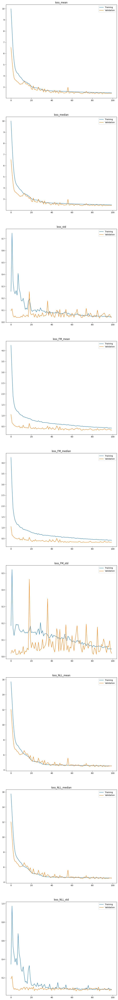

In [ ]:
visualize_training_results(r, loglog = False)

In [27]:
trainer.load_best_model()

In [28]:
model = trainer.model

In [29]:
model.eval()

TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2(
  (encoder): TransformerReturnRepresentations(
    (mlp1): PositionwiseFeedForward(
      (w_1): Linear(in_features=11, out_features=197, bias=True)
      (w_2): Linear(in_features=197, out_features=384, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (act1): LeakyReLU(negative_slope=0.01)
    (encoder_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=384, out_features=384, bias=True)
      )
      (linear1): Linear(in_features=384, out_features=768, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=768, out_features=384, bias=True)
      (norm1): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
   

In [30]:
trainer.load_best_model()

In [31]:
trainer.model.cuda()

TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2(
  (encoder): TransformerReturnRepresentations(
    (mlp1): PositionwiseFeedForward(
      (w_1): Linear(in_features=11, out_features=197, bias=True)
      (w_2): Linear(in_features=197, out_features=384, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (act1): LeakyReLU(negative_slope=0.01)
    (encoder_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=384, out_features=384, bias=True)
      )
      (linear1): Linear(in_features=384, out_features=768, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=768, out_features=384, bias=True)
      (norm1): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
   

In [32]:
trainer.test()

100%|██████████| 196/196 [00:52<00:00,  3.72it/s]


{'loss_mean': 2.403855323791504,
 'loss_median': 2.4008748531341553,
 'loss_std': 0.05054308846592903,
 'loss_FM_mean': 0.3351452350616455,
 'loss_FM_median': 0.32246196269989014,
 'loss_FM_std': 0.039381977170705795,
 'loss_NLL_mean': 4.472565174102783,
 'loss_NLL_median': 4.4781317710876465,
 'loss_NLL_std': 0.081819549202919}

In [33]:
#?ModelToPosteriorCNF

In [34]:
N_SAMPLES_PER_MODEL = 1_000

In [35]:
full_model = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=N_SAMPLES_PER_MODEL,
    batch_size = BATCH_SIZE//4,
    solve_adjoint = True,
    atol = 1e-8,
    rtol = 1e-8,
    #device = torch.device("cpu")
    name = "full_model"
)

full_model_no_FM = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=N_SAMPLES_PER_MODEL,
    batch_size = BATCH_SIZE//4,
    solve_adjoint = True,
    atol = 1e-8,
    rtol = 1e-8,
    sample_only_base_dist = True,
    name = "full_model_no_FM"
)


benchmark_params_ppgrogram = data_generator.curriculum.get_params(-1)
print(f"params for pprogram: {benchmark_params_ppgrogram}")

pprogram1 = make_lm_program(**benchmark_params_ppgrogram)

pprogram1_y = return_only_y(pprogram1)
print_code(pprogram1)






params for pprogram: {'tau': 0.5, 'a': 5.0, 'b': 2.0}
        def multivariate_lm_return_dict(x: torch.Tensor, y: torch.Tensor = None) -> dict:
                # Define distributions for the global parameters
                sigma_squared_dist = dist.InverseGamma(a, b)

                beta_cov = torch.eye(x.shape[1]) * (tau ** 2)  # the covariance matrix of the parameters of the linear model

                sigma_squared = pyro.sample("sigma_squared", sigma_squared_dist).squeeze()

                beta_dist = dist.MultivariateNormal(torch.zeros(x.shape[1]), beta_cov)
                beta = pyro.sample("beta", beta_dist)

                # Compute mean using matrix multiplication
                mean = torch.matmul(x, beta)

                p = torch.sigmoid(mean)

                y_dist = dist.Bernoulli(p).to_event(1)

                y = pyro.sample("obs", y_dist, obs=y)


                return {
                        "x": x,
                        "y": y,
                      

In [36]:
hmc_sampler = Hamiltionian_MC(pprogram = pprogram1_y, n_warmup=500, n_samples=N_SAMPLES_PER_MODEL)

vi_diag = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoDiagonalNormal,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)

vi_multivariate_normal = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoMultivariateNormal,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)
vi_laplace = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoLaplaceApproximation,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)

vi_autoIAF = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun=AutoIAFNormal,
    #additional_make_guide_args={"num_transforms": 5, "hidden_dim" : 100},
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-3
)

vi_autostrucured = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun=AutoStructured,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)


In [37]:
evaluation = Evaluate(
    posterior_model = full_model,
    evaluation_loader = trainer.testset,
    comparison_models= [
                        full_model_no_FM,
                        vi_diag,
                        vi_multivariate_normal,
                        vi_laplace,
                        vi_autoIAF,
                        vi_autostrucured,
                        hmc_sampler
                        ],
    n_evaluation_cases=100,
    save_path= SAVE_PATH_EVALUATION,
    overwrite_results = True
)

The save path is not empty and the overwrite flag is set, the results will be overwritten


In [38]:
evaluation.run_evaluation()

Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:10<17:53, 10.84s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:21<17:28, 10.70s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:32<17:14, 10.66s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:42<16:54, 10.57s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [00:53<16:47, 10.60s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:03<16:25, 10.49s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:13<16:12, 10.46s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:24<16:05, 10.49s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:35<16:04, 10.60s/it]

....................


Sampling posterior:  10%|█         | 10/100 [01:45<15:51, 10.58s/it]

....................


Sampling posterior:  11%|█         | 11/100 [01:56<15:40, 10.57s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:06<15:31, 10.58s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:17<15:14, 10.51s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:27<15:05, 10.53s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [02:38<14:55, 10.54s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [02:49<14:52, 10.63s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [02:59<14:44, 10.66s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:10<14:30, 10.62s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [03:20<14:13, 10.54s/it]

....................


Sampling posterior:  20%|██        | 20/100 [03:31<14:09, 10.62s/it]

....................


Sampling posterior:  21%|██        | 21/100 [03:42<13:55, 10.57s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [03:52<13:42, 10.54s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [04:03<13:38, 10.63s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [04:13<13:26, 10.62s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [04:24<13:14, 10.59s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [04:34<13:01, 10.56s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [04:45<12:54, 10.61s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [04:56<12:44, 10.62s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [05:06<12:31, 10.59s/it]

....................


Sampling posterior:  30%|███       | 30/100 [05:17<12:28, 10.69s/it]

....................


Sampling posterior:  31%|███       | 31/100 [05:28<12:13, 10.62s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [05:38<11:57, 10.56s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [05:49<11:45, 10.53s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [05:59<11:40, 10.62s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [06:10<11:28, 10.60s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [06:21<11:18, 10.61s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [06:31<11:08, 10.61s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [06:42<10:59, 10.64s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [06:53<10:48, 10.62s/it]

....................


Sampling posterior:  40%|████      | 40/100 [07:03<10:35, 10.59s/it]

....................


Sampling posterior:  41%|████      | 41/100 [07:14<10:28, 10.65s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [07:25<10:22, 10.74s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [07:35<10:08, 10.68s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [07:46<09:53, 10.60s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [07:57<09:45, 10.65s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [08:07<09:32, 10.60s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [08:18<09:21, 10.60s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [08:28<09:11, 10.61s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [08:39<09:04, 10.68s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [08:50<08:53, 10.66s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [09:00<08:38, 10.58s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [09:11<08:29, 10.62s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [09:22<08:20, 10.65s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [09:32<08:09, 10.64s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [09:43<07:57, 10.61s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [09:54<07:50, 10.70s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [10:04<07:36, 10.62s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [10:15<07:25, 10.60s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [10:25<07:15, 10.63s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [10:36<07:05, 10.63s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [10:46<06:52, 10.59s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [10:57<06:43, 10.63s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [11:08<06:37, 10.75s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [11:19<06:22, 10.64s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [11:29<06:12, 10.63s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [11:40<06:06, 10.77s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [11:51<05:53, 10.70s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [12:01<05:41, 10.68s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [12:12<05:30, 10.68s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [12:23<05:21, 10.73s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [12:33<05:08, 10.64s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [12:44<04:58, 10.65s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [12:55<04:49, 10.74s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [13:06<04:38, 10.70s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [13:16<04:26, 10.64s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [13:27<04:14, 10.62s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [13:38<04:05, 10.68s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [13:48<03:53, 10.63s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [13:58<03:42, 10.58s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [14:09<03:33, 10.66s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [14:20<03:22, 10.64s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [14:31<03:11, 10.65s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [14:41<03:01, 10.67s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [14:52<02:51, 10.74s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [15:03<02:40, 10.69s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [15:13<02:28, 10.61s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [15:24<02:18, 10.66s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [15:35<02:07, 10.64s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [15:45<01:57, 10.66s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [15:56<01:46, 10.64s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [16:07<01:36, 10.73s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [16:18<01:25, 10.74s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [16:28<01:14, 10.66s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [16:39<01:04, 10.69s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [16:50<00:53, 10.72s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [17:00<00:42, 10.70s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [17:11<00:32, 10.73s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [17:22<00:21, 10.85s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [17:33<00:10, 10.85s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:12<21:01, 12.74s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:25<20:33, 12.59s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:37<20:21, 12.59s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:50<20:16, 12.68s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:02<19:48, 12.51s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:15<19:34, 12.50s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:27<19:18, 12.46s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:40<19:12, 12.53s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:52<18:57, 12.50s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:05<18:41, 12.46s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:17<18:33, 12.51s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:30<18:21, 12.52s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:42<18:11, 12.54s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:55<18:01, 12.58s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:08<17:45, 12.54s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:20<17:31, 12.52s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:33<17:22, 12.56s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:45<17:03, 12.49s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [03:58<16:53, 12.51s/it]

....................


Sampling posterior:  20%|██        | 20/100 [04:10<16:38, 12.48s/it]

....................


Sampling posterior:  21%|██        | 21/100 [04:23<16:29, 12.53s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [04:35<16:13, 12.49s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [04:48<16:02, 12.51s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [05:00<15:55, 12.57s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [05:13<15:40, 12.54s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [05:25<15:25, 12.51s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [05:38<15:19, 12.59s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [05:50<15:04, 12.57s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [06:03<14:56, 12.63s/it]

....................


Sampling posterior:  30%|███       | 30/100 [06:16<14:46, 12.67s/it]

....................


Sampling posterior:  31%|███       | 31/100 [06:29<14:32, 12.64s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [06:41<14:13, 12.55s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [06:53<14:00, 12.54s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [07:06<13:51, 12.61s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [07:19<13:35, 12.54s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [07:31<13:21, 12.52s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [07:44<13:10, 12.55s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [07:56<12:53, 12.48s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [08:08<12:39, 12.45s/it]

....................


Sampling posterior:  40%|████      | 40/100 [08:21<12:27, 12.45s/it]

....................


Sampling posterior:  41%|████      | 41/100 [08:34<12:20, 12.55s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [08:46<12:07, 12.55s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [08:59<11:55, 12.56s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [09:11<11:44, 12.57s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [09:24<11:30, 12.56s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [09:36<11:16, 12.53s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [09:49<11:10, 12.65s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [10:02<10:52, 12.55s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [10:14<10:37, 12.51s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [10:27<10:28, 12.56s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [10:39<10:12, 12.50s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [10:51<09:57, 12.46s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [11:04<09:46, 12.48s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [11:17<09:36, 12.53s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [11:29<09:23, 12.52s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [11:42<09:09, 12.50s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [11:54<08:58, 12.52s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [12:07<08:45, 12.50s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [12:19<08:32, 12.51s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [12:32<08:23, 12.58s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [12:44<08:08, 12.53s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [12:57<07:55, 12.50s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [13:09<07:43, 12.53s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [13:22<07:33, 12.60s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [13:34<07:17, 12.49s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [13:47<07:03, 12.45s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [13:59<06:53, 12.54s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [14:12<06:39, 12.50s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [14:24<06:29, 12.56s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [14:37<06:17, 12.58s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [14:49<06:03, 12.52s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [15:02<05:48, 12.46s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [15:14<05:35, 12.41s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [15:27<05:24, 12.49s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [15:39<05:11, 12.47s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [15:52<04:59, 12.47s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [16:04<04:48, 12.54s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [16:17<04:34, 12.48s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [16:29<04:21, 12.44s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [16:42<04:11, 12.55s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [16:54<03:57, 12.49s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [17:07<03:43, 12.44s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [17:19<03:31, 12.46s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [17:32<03:21, 12.59s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [17:44<03:08, 12.56s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [17:57<02:54, 12.49s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [18:09<02:43, 12.55s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [18:22<02:29, 12.48s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [18:34<02:17, 12.46s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [18:47<02:05, 12.55s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [18:59<01:52, 12.48s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [19:12<01:39, 12.45s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [19:24<01:27, 12.45s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [19:37<01:15, 12.54s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [19:49<01:02, 12.52s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [20:02<00:49, 12.49s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [20:14<00:37, 12.54s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [20:27<00:24, 12.50s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [20:39<00:12, 12.49s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:09<15:37,  9.47s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:18<15:28,  9.48s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:28<15:11,  9.40s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:37<15:13,  9.51s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [00:47<15:03,  9.51s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [00:56<14:52,  9.49s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:06<14:36,  9.42s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:15<14:33,  9.49s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:25<14:25,  9.51s/it]

....................


Sampling posterior:  10%|█         | 10/100 [01:34<14:17,  9.53s/it]

....................


Sampling posterior:  11%|█         | 11/100 [01:44<14:03,  9.48s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [01:53<13:56,  9.51s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:03<13:45,  9.49s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:12<13:40,  9.54s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [02:22<13:23,  9.45s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [02:31<13:15,  9.46s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [02:41<13:08,  9.49s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [02:50<12:56,  9.48s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [03:00<12:45,  9.45s/it]

....................


Sampling posterior:  20%|██        | 20/100 [03:09<12:37,  9.47s/it]

....................


Sampling posterior:  21%|██        | 21/100 [03:18<12:24,  9.43s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [03:28<12:16,  9.44s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [03:37<12:06,  9.43s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [03:47<11:59,  9.46s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [03:56<11:51,  9.49s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [04:06<11:39,  9.46s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [04:15<11:28,  9.43s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [04:25<11:20,  9.45s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [04:34<11:08,  9.41s/it]

....................


Sampling posterior:  30%|███       | 30/100 [04:43<10:58,  9.41s/it]

....................


Sampling posterior:  31%|███       | 31/100 [04:53<10:50,  9.43s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [05:02<10:42,  9.45s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [05:12<10:30,  9.41s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [05:21<10:17,  9.36s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [05:30<10:08,  9.37s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [05:40<10:02,  9.42s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [05:49<09:51,  9.38s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [05:58<09:41,  9.37s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [06:08<09:32,  9.39s/it]

....................


Sampling posterior:  40%|████      | 40/100 [06:18<09:27,  9.46s/it]

....................


Sampling posterior:  41%|████      | 41/100 [06:27<09:15,  9.41s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [06:36<09:07,  9.44s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [06:46<08:58,  9.44s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [06:56<08:55,  9.56s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [07:05<08:42,  9.50s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [07:14<08:30,  9.46s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [07:24<08:18,  9.41s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [07:33<08:12,  9.47s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [07:42<07:58,  9.38s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [07:52<07:50,  9.40s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [08:02<07:44,  9.48s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [08:11<07:33,  9.45s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [08:21<07:26,  9.51s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [08:30<07:15,  9.47s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [08:39<07:04,  9.44s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [08:49<06:58,  9.52s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [08:58<06:46,  9.45s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [09:08<06:35,  9.41s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [09:17<06:25,  9.41s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [09:27<06:18,  9.45s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [09:36<06:07,  9.41s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [09:45<05:57,  9.41s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [09:55<05:49,  9.44s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [10:04<05:41,  9.49s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [10:14<05:30,  9.43s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [10:23<05:18,  9.37s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [10:32<05:10,  9.41s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [10:42<05:03,  9.49s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [10:52<04:53,  9.47s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [11:01<04:41,  9.39s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [11:10<04:32,  9.40s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [11:20<04:24,  9.46s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [11:29<04:14,  9.43s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [11:38<04:04,  9.39s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [11:48<03:54,  9.37s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [11:57<03:47,  9.48s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [12:07<03:37,  9.46s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [12:16<03:26,  9.39s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [12:25<03:16,  9.35s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [12:35<03:08,  9.42s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [12:44<02:58,  9.40s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [12:54<02:48,  9.37s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [13:03<02:38,  9.35s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [13:12<02:30,  9.40s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [13:22<02:22,  9.50s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [13:32<02:13,  9.51s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [13:41<02:02,  9.41s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [13:50<01:52,  9.41s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [14:00<01:44,  9.53s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [14:10<01:35,  9.50s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [14:19<01:24,  9.42s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [14:28<01:15,  9.47s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [14:38<01:06,  9.47s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [14:47<00:56,  9.45s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [14:56<00:46,  9.40s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [15:06<00:37,  9.45s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [15:15<00:28,  9.44s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [15:25<00:18,  9.45s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [15:34<00:09,  9.41s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:13<23:02, 13.97s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:27<22:44, 13.92s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:42<22:42, 14.05s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:56<22:27, 14.03s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:09<22:08, 13.98s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:24<22:04, 14.09s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:38<21:45, 14.04s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:52<21:38, 14.12s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [02:06<21:18, 14.05s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:20<21:02, 14.02s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:34<20:50, 14.05s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:48<20:30, 13.98s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [03:02<20:24, 14.07s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:16<20:07, 14.04s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:30<19:55, 14.06s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:44<19:46, 14.13s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:58<19:27, 14.07s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [04:13<19:19, 14.13s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [04:27<19:00, 14.08s/it]

....................


Sampling posterior:  20%|██        | 20/100 [04:40<18:42, 14.03s/it]

....................


Sampling posterior:  21%|██        | 21/100 [04:55<18:32, 14.09s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [05:09<18:14, 14.04s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [05:23<18:04, 14.08s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [05:37<17:47, 14.05s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [05:51<17:30, 14.01s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [06:05<17:21, 14.07s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [06:19<17:05, 14.04s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [06:33<16:56, 14.12s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [06:47<16:36, 14.03s/it]

....................


Sampling posterior:  30%|███       | 30/100 [07:01<16:21, 14.02s/it]

....................


Sampling posterior:  31%|███       | 31/100 [07:15<16:11, 14.08s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [07:29<15:55, 14.05s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [07:43<15:40, 14.03s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [07:57<15:28, 14.08s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [08:11<15:11, 14.03s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [08:26<15:03, 14.12s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [08:40<14:46, 14.08s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [08:54<14:33, 14.09s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [09:08<14:22, 14.14s/it]

....................


Sampling posterior:  40%|████      | 40/100 [09:22<14:03, 14.06s/it]

....................


Sampling posterior:  41%|████      | 41/100 [09:36<13:51, 14.08s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [09:50<13:39, 14.13s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [10:04<13:22, 14.08s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [10:18<13:10, 14.12s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [10:32<12:55, 14.10s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [10:46<12:37, 14.04s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [11:01<12:26, 14.09s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [11:15<12:10, 14.06s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [11:29<11:57, 14.08s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [11:43<11:42, 14.05s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [11:57<11:27, 14.04s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [12:11<11:18, 14.13s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [12:25<11:02, 14.10s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [12:39<10:51, 14.16s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [12:53<10:34, 14.09s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [13:07<10:20, 14.11s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [13:22<10:07, 14.14s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [13:36<09:53, 14.12s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [13:50<09:41, 14.17s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [14:04<09:26, 14.16s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [14:18<09:10, 14.12s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [14:32<08:57, 14.15s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [14:46<08:42, 14.12s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [15:01<08:29, 14.16s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [15:15<08:13, 14.09s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [15:29<07:58, 14.07s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [15:43<07:46, 14.15s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [15:57<07:31, 14.11s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [16:11<07:18, 14.15s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [16:25<07:02, 14.10s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [16:39<06:47, 14.04s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [16:53<06:34, 14.10s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [17:07<06:19, 14.06s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [17:22<06:08, 14.16s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [17:36<05:52, 14.11s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [17:50<05:38, 14.09s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [18:04<05:27, 14.24s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [18:19<05:13, 14.25s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [18:33<05:02, 14.42s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [18:48<04:48, 14.43s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [19:02<04:32, 14.36s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [19:16<04:18, 14.34s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [19:30<04:02, 14.25s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [19:45<03:48, 14.26s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [19:59<03:32, 14.16s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [20:13<03:17, 14.09s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [20:27<03:03, 14.12s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [20:41<02:48, 14.06s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [20:55<02:35, 14.09s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [21:09<02:20, 14.07s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [21:23<02:06, 14.04s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [21:37<01:52, 14.09s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [21:51<01:38, 14.08s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [22:05<01:24, 14.13s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [22:19<01:10, 14.10s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [22:33<00:56, 14.05s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [22:48<00:42, 14.12s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [23:01<00:28, 14.07s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [23:16<00:14, 14.11s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:15<25:59, 15.75s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:31<25:18, 15.49s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:46<25:12, 15.59s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [01:02<24:56, 15.59s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:17<24:33, 15.51s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:33<24:23, 15.57s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:49<24:09, 15.58s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [02:04<23:52, 15.57s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [02:19<23:29, 15.49s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:35<23:21, 15.57s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:51<23:05, 15.57s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [03:06<22:51, 15.59s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [03:22<22:27, 15.49s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:37<22:16, 15.54s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:53<21:57, 15.50s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [04:08<21:46, 15.56s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [04:24<21:25, 15.48s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [04:39<21:17, 15.57s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [04:55<21:05, 15.63s/it]

....................


Sampling posterior:  20%|██        | 20/100 [05:11<20:44, 15.55s/it]

....................


Sampling posterior:  21%|██        | 21/100 [05:26<20:35, 15.63s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [05:42<20:12, 15.54s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [05:58<20:04, 15.64s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [06:13<19:42, 15.56s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [06:29<19:28, 15.58s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [06:44<19:07, 15.50s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [07:00<18:57, 15.59s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [07:15<18:41, 15.57s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [07:31<18:26, 15.59s/it]

....................


Sampling posterior:  30%|███       | 30/100 [07:46<18:06, 15.53s/it]

....................


Sampling posterior:  31%|███       | 31/100 [08:02<17:54, 15.57s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [08:17<17:34, 15.51s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [08:33<17:21, 15.54s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [08:49<17:08, 15.59s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [09:04<16:50, 15.55s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [09:20<16:37, 15.59s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [09:35<16:17, 15.52s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [09:51<15:59, 15.48s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [10:06<15:40, 15.41s/it]

....................


Sampling posterior:  40%|████      | 40/100 [10:21<15:27, 15.46s/it]

....................


Sampling posterior:  41%|████      | 41/100 [10:37<15:10, 15.44s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [10:52<14:58, 15.49s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [11:08<14:40, 15.46s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [11:24<14:33, 15.61s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [11:39<14:13, 15.52s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [11:54<13:54, 15.46s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [12:10<13:36, 15.40s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [12:25<13:26, 15.50s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [12:41<13:09, 15.47s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [12:56<12:58, 15.56s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [13:12<12:43, 15.58s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [13:28<12:26, 15.56s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [13:43<12:12, 15.59s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [13:59<11:52, 15.50s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [14:14<11:40, 15.56s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [14:30<11:24, 15.55s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [14:45<11:09, 15.57s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [15:01<10:49, 15.46s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [15:16<10:36, 15.51s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [15:32<10:22, 15.57s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [15:48<10:08, 15.60s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [16:03<09:52, 15.58s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [16:18<09:32, 15.46s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [16:34<09:21, 15.59s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [16:50<09:04, 15.55s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [17:05<08:49, 15.57s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [17:21<08:30, 15.47s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [17:37<08:19, 15.62s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [17:52<08:00, 15.49s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [18:07<07:45, 15.52s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [18:23<07:29, 15.49s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [18:38<07:16, 15.58s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [18:54<06:58, 15.50s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [19:09<06:43, 15.51s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [19:25<06:26, 15.46s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [19:41<06:14, 15.59s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [19:56<05:58, 15.57s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [20:12<05:42, 15.55s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [20:27<05:24, 15.45s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [20:43<05:10, 15.53s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [20:58<04:53, 15.47s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [21:13<04:37, 15.40s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [21:29<04:22, 15.45s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [21:44<04:06, 15.42s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [22:00<03:52, 15.49s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [22:15<03:36, 15.46s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [22:31<03:21, 15.47s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [22:46<03:06, 15.51s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [23:02<02:51, 15.60s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [23:17<02:35, 15.50s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [23:33<02:19, 15.54s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [23:48<02:03, 15.49s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [24:04<01:49, 15.62s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [24:19<01:33, 15.52s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [24:35<01:17, 15.46s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [24:51<01:02, 15.54s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [25:06<00:46, 15.54s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [25:22<00:31, 15.58s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [25:37<00:15, 15.50s/it]

....................


100%|██████████| 100/100 [00:00<00:00, 633.58it/s]


An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_MAP: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covaria

100%|██████████| 100/100 [06:41<00:00,  4.01s/it]


Comparison to ground truth:

Summarized results:


,Model,GT,Mean_joint_Wasserstein_distance with metric euclidean,Mean_joint_MMD,Mean_joint_cst_roc_auc,Mean_gt_parameter_Perplextiy,Mean_gt_parameter_MAP diff,Mean_gt_parameter_Mean diff,Std_joint_Wasserstein_distance with metric euclidean,Std_joint_MMD,Std_joint_cst_roc_auc,Std_gt_parameter_Perplextiy,Std_gt_parameter_MAP diff,Std_gt_parameter_Mean diff
0,full_model,gt,14.186214,0.059555,0.46590,-4.978070,0.333010,0.313889,0.004869,0.000208,0.034855,2.546532,0.089893,0.087277
1,full_model_no_FM,gt,14.186003,0.059571,0.46895,-4.865668,0.340106,0.314004,0.004832,0.000192,0.031753,2.466504,0.086614,0.086562
2,Variational Inference with guide: AutoDiagonal...,gt,14.170365,0.059526,0.47085,-6.881454,0.322348,0.313559,0.003820,0.000148,0.032761,5.792284,0.084227,0.082804
3,Variational Inference with guide: AutoMultivar...,gt,14.188735,0.059477,0.46780,-4.995732,0.333949,0.313742,0.004306,0.000200,0.032383,2.734220,0.088789,0.085748
4,Variational Inference with guide: AutoLaplaceA...,gt,14.140654,0.059603,0.54130,NaN,NaN,0.312102,0.000000,0.000000,0.035059,NaN,NaN,0.083632
5,Variational Inference with guide: AutoIAFNorma...,gt,14.189594,0.059437,0.46805,-4.805684,0.333342,0.313883,0.005104,0.000192,0.034553,2.395875,0.081996,0.083815
6,Variational Inference with guide: AutoStructur...,gt,14.188860,0.059469,0.46890,-4.950696,0.328640,0.312440,0.004773,0.000171,0.032849,2.582807,0.082686,0.084353
7,Hamiltonian Monte Carlo,gt,14.189839,0.059481,0.46840,-4.707124,0.319270,0.312227,0.004810,0.000161,0.035369,2.393959,0.085722,0.083077


P-values:


,Model 1,Model 2,joint_Wasserstein_distance with metric euclidean_p-value,joint_MMD_p-value,joint_cst_roc_auc_p-value,gt_parameter_Perplextiy_p-value,gt_parameter_MAP diff_p-value,gt_parameter_Mean diff_p-value
0,full_model,full_model_no_FM,6.229450e-01,7.478439e-01,4.200722e-01,0.493832,0.066858,0.817806
1,full_model,Variational Inference with guide: AutoDiagonal...,4.531861e-18,2.974987e-01,2.719263e-01,0.000015,0.062867,0.945175
2,full_model,Variational Inference with guide: AutoMultivar...,9.934479e-05,6.234324e-03,7.934782e-01,0.923304,0.667348,0.986284
3,full_model,Variational Inference with guide: AutoLaplaceA...,3.896560e-18,1.189863e-02,1.215730e-17,NaN,NaN,0.451454
4,full_model,Variational Inference with guide: AutoIAFNorma...,3.978236e-06,1.002973e-05,9.766749e-01,0.610842,0.893328,0.674869
5,full_model,Variational Inference with guide: AutoStructur...,3.678938e-04,8.275119e-03,6.319545e-01,0.858100,0.715513,0.608434
6,full_model,Hamiltonian Monte Carlo,3.413881e-07,7.945177e-03,5.059605e-01,0.147747,0.015350,0.554258
7,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,3.896560e-18,1.679662e-01,7.997304e-01,0.000005,0.001775,0.874328
8,full_model_no_FM,Variational Inference with guide: AutoMultivar...,4.893322e-05,2.580842e-03,7.174034e-01,0.570494,0.509152,0.879750
9,full_model_no_FM,Variational Inference with guide: AutoLaplaceA...,3.896560e-18,2.875863e-02,4.459074e-17,NaN,NaN,0.401497



Comparison among models:

Summarized results:


,Model 1,Model 2,Mean_Wasserstein_distance with metric euclidean,Mean_MMD,Mean_cst_roc_auc,Std_Wasserstein_distance with metric euclidean,Std_MMD,Std_cst_roc_auc
0,full_model,full_model_no_FM,0.761801,0.006130,0.500625,0.012478,0.001331,0.012176
1,full_model,Variational Inference with guide: AutoDiagonal...,0.788874,0.139900,0.735280,0.014795,0.029335,0.024138
2,full_model,Variational Inference with guide: AutoMultivar...,0.792509,0.041219,0.597470,0.020434,0.014151,0.024008
3,full_model,Variational Inference with guide: AutoLaplaceA...,1.231243,2.201318,1.000000,0.016903,0.014617,0.000000
4,full_model,Variational Inference with guide: AutoIAFNorma...,0.784843,0.031588,0.570165,0.017143,0.010696,0.022427
5,full_model,Variational Inference with guide: AutoStructur...,0.793324,0.042709,0.593170,0.019925,0.014539,0.027097
6,full_model,Hamiltonian Monte Carlo,0.785607,0.028641,0.577575,0.014396,0.007941,0.018322
7,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,0.788698,0.139850,0.735950,0.016464,0.029607,0.023613
8,full_model_no_FM,Variational Inference with guide: AutoMultivar...,0.792952,0.041410,0.599535,0.019771,0.014182,0.023514
9,full_model_no_FM,Variational Inference with guide: AutoLaplaceA...,1.230691,2.200950,1.000000,0.018165,0.016034,0.000000


P-values:


,Pair 1: Model A,Pair 1: Model B,Pair 2: Model A,Pair 2: Model B,Wasserstein_distance with metric euclidean_p-value,MMD_p-value,cst_roc_auc_p-value
0,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoDiagonal...,3.918115e-25,2.561999e-34,2.554362e-34
1,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoMultivar...,7.465304e-24,2.561999e-34,2.552492e-34
2,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoLaplaceA...,2.562144e-34,2.561999e-34,5.624695e-39
3,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoIAFNorma...,1.600461e-20,2.561999e-34,3.886599e-34
4,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoStructur...,2.250019e-24,2.561999e-34,2.554937e-34
...,...,...,...,...,...,...,...
163,Variational Inference with guide: AutoLaplaceA...,Hamiltonian Monte Carlo,Variational Inference with guide: AutoIAFNorma...,Hamiltonian Monte Carlo,2.562144e-34,2.561999e-34,5.626763e-39
164,Variational Inference with guide: AutoLaplaceA...,Hamiltonian Monte Carlo,Variational Inference with guide: AutoStructur...,Hamiltonian Monte Carlo,2.562144e-34,2.562144e-34,5.628418e-39
165,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoStructur...,Variational Inference with guide: AutoIAFNorma...,Hamiltonian Monte Carlo,6.347540e-03,2.437905e-28,4.852458e-11
166,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoStructur...,Variational Inference with guide: AutoStructur...,Hamiltonian Monte Carlo,7.684306e-01,5.341850e-05,5.281053e-02


{'summarized_results': {'comparison_to_gt':                                                Model  GT  \
  0                                         full_model  gt   
  1                                   full_model_no_FM  gt   
  2  Variational Inference with guide: AutoDiagonal...  gt   
  3  Variational Inference with guide: AutoMultivar...  gt   
  4  Variational Inference with guide: AutoLaplaceA...  gt   
  5  Variational Inference with guide: AutoIAFNorma...  gt   
  6  Variational Inference with guide: AutoStructur...  gt   
  7                            Hamiltonian Monte Carlo  gt   
  
     Mean_joint_Wasserstein_distance with metric euclidean  Mean_joint_MMD  \
  0                                          14.186214            0.059555   
  1                                          14.186003            0.059571   
  2                                          14.170365            0.059526   
  3                                          14.188735            0.059477   
  4    

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

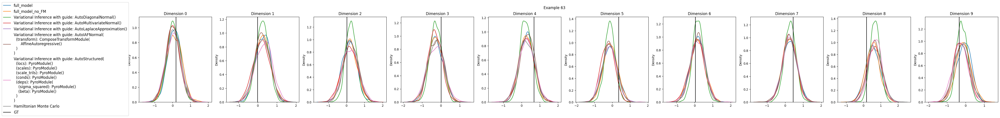

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

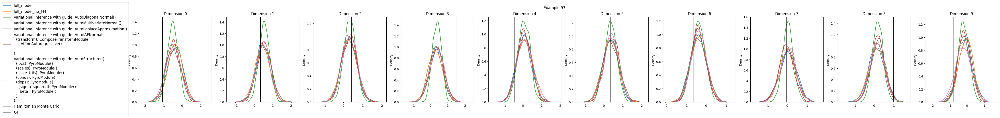

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

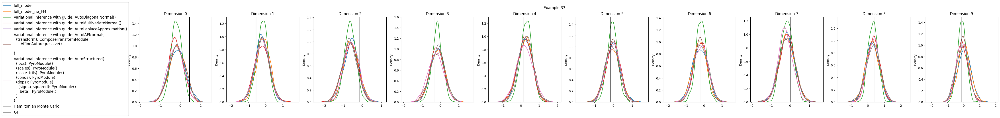

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

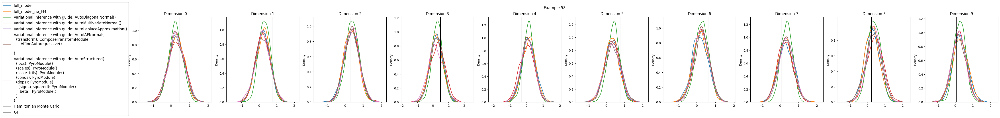

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

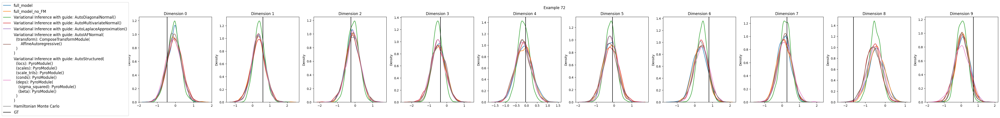

In [39]:
evaluation.plot_results()